### Library Imports

In [17]:
import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, r2_score, mean_squared_error
from sklearn.ensemble import RandomForestClassifier

In [2]:
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\seren\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\seren\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\seren\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [3]:
lemmatizer = WordNetLemmatizer()
pipeline = Pipeline([
    ('vectorizer', CountVectorizer()),
    ('tfidf_izer', TfidfTransformer())
])

In [4]:
mbti_types = ["istj", "isfj", "infj", "intj", "istp", "isfp", "infp", "intp",
             "estj", "esfj", "enfj", "entj", "estp", "esfp", "enfp", "entp"]

### Reading Target Data File

In [5]:
mbti_df = pd.read_csv(r"C:\Users\seren\OneDrive\Documents\datasets_3730\mbti_cleaned.csv")

In [6]:
mbti_df.head()

,type,post1,post2,post3,post4,post5,post6,post7,post8,post9,...,post41,post42,post43,post44,post45,post46,post47,post48,post49,post50
0,INFP,'I used to play a bit of Skyrim (i found it ap...,"Hello, I am a former member of PC. I decided ...",sincere sensations have left my body to aid ot...,i've been told i look like jackson rathbone (t...,this one is of me killing myself slowly with a...,the video is me and my band (i'm the singer cl...,sudden movement crackling noises camp fire jo...,trapped in his own skin he opened his eyes to ...,when your cigarette smoke is inspiration enoug...,...,children redirect your eyes examine your lives...,i see it this way everything tends towards cha...,"yes, i like going to social events to observe ...",lyrics that could be read off of paper like po...,ideal you,real you,Introversion,0.7,73% Extroversion,0.23
1,ENFP,"'Where would you live? Canada/US, somewhere wi...",I'm passively attracted to certain attributes ...,I can be both impatient and stubborn which are...,You're so cute Wait... you're not on drugs? Ca...,I want to console and always be there for a gu...,Never posted in the ENFP section before since ...,There must be something wrong with my personal...,Really got to start posting videos here!! ...,Jeff Buckley! He was such a beautiful human be...,...,Completely over-thinking life right now or am ...,NONE OF MY LISTS ARE IN ANY ORDER 25 Songs yo...,ideal you,real you,Introversion,0.43,73% Extroversion,0.7,40% Intuitive,0.73
2,INTP,'I'm an INTP who knows an ISFJ and an ESFJ. I ...,cheeky nandos,I love Paula Polestar,"I'm pretty thin, but not underweight. My weigh...",How much wood does a woodchuck chuck if a wood...,I'm never lonely.,VIDEO - Furry Class Presentation,The Cringe Channel Lord help us.,https://www.youtube.com/watch?v=rkZ9sSgGPrs,...,XD im rAdomer than u!!!lol....this is a good t...,"I came from a religious family too, like many ...","Why are you drunk, sir?",I'm so tired. Today during school I was buzzin...,Holy shit the number of pages,I don't know how I would handle that situation.,I don't know how I would handle that situation.,Hmm....maybe.,"Dogs are shit, cats are also shit, animals suck.",376570
3,INFJ,"'Some people need more, others need less. But ...",:sun-smiley:,"A lot of problems can be solved, if you proper...",:hugs:,Caffeinated and Optimistic. :smileys-sunbathin...,"473746 The process is very relaxing, and the ...",Sounds like my life growing up. Of course publ...,Everything is better if kept simple...,Fuck You. And fuck you. And fuck YOU. (Venting...,...,My answers are simple and to the point since I...,From brunette to blonde,"Today like everyday, I struggle to find a bala...",Any threads out there for INFJ parents to vent...,Deep down we're all just wild animals that soc...,I understand. As an INFJ you automatically con...,Same here. I don't talk to either my mom or da...,So a non believer trolling about. A true INFJ ...,I think the easiest way to recognize it is whe...,471162
4,INTP,"'It would be funny to Ask them,What is the dif...",I think the first one might have to do with ac...,Absolutely.I wish I could do maths and other s...,I agree with Chucky.I contact people if I have...,https://www.youtube.com/watch?v=e72tG80LmsU I ...,https://www.youtube.com/watch?v=myc7eHGg5y4&fe...,Ne. https://www.youtube.com/watch?annotation_...,Your avatar.It looks as though the thing looks...,Why would anyone want to fake their personalit...,...,686154,686098686106,It can be ASCII as well as Hexadecimal numbers...,Not yet decided on any of the existing theories.,https://www.youtube.com/watch?v=J5iJSXaVvao h...,I thought Artificial neural networks was the(...,I use Audacity.Which one(software) do you use ...,What software did you use for mixing?Btw You h...,683914,683906


### Data Pre-Processing

In [7]:
for column in mbti_df.columns[1:]:

    # to lower case
    mbti_df[column] = mbti_df[column].str.lower()

    # remove URLs
    mbti_df[column] = mbti_df[column].apply(lambda x: re.sub(r'http\S+', ' ', str(x), flags = re.MULTILINE))

    # remove special characters and numbers
    mbti_df[column] = mbti_df[column].apply(lambda x: re.sub(r'[^a-zA-Z\s]', ' ', str(x)))

    # remove extra spaces
    mbti_df[column] = mbti_df[column].str.replace(r'\s+', ' ', regex = True)

    # remove the stop words
    stopWords = set(stopwords.words('english'))
    mbti_df[column] = mbti_df[column].apply(lambda x: ' '.join([word for word in str(x).split() if word not in stopWords]))
    
    # remove the mbti types from the dataset
    for mbti in mbti_types:
        mbti_df[column] = mbti_df[column].str.replace(mbti.lower(), '')
    
    # lemmatize the words in the dataset
    mbti_df[column] = mbti_df[column].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in str(x).split()]))

In [8]:
mbti_df.head(3)

,type,post1,post2,post3,post4,post5,post6,post7,post8,post9,...,post41,post42,post43,post44,post45,post46,post47,post48,post49,post50
0,INFP,used play bit skyrim found appealing able evil...,hello former member pc decided create new user...,sincere sensation left body aid poet rhyming w...,told look like jackson rathbone guy play jaspe...,one killing slowly cigarette roll cause tax sh...,video band singer clinging mic wearing shirt w...,sudden movement crackling noise camp fire joy ...,trapped skin opened eye see figure paralyzed f...,cigarette smoke inspiration enough write poem ...,...,child redirect eye examine life keep mind mind...,see way everything tends towards chaos anyway ...,yes like going social event observe people usu...,lyric could read paper like poetry lyric provo...,ideal,real,introversion,,extroversion,
1,ENFP,would live canada u somewhere view stunning mo...,passively attracted certain attribute guy thin...,impatient stubborn great mix usually look ever...,cute wait drug whatever stop positive stop neg...,want console always guy know tough life time t...,never posted section since type seems changed ...,must something wrong personality always proble...,really got start posting video loving music re...,jeff buckley beautiful human every way also au...,...,completely thinking life right thinking idea h...,none list order song wish could listed thread ...,ideal,real,introversion,,extroversion,,intuitive,
2,INTP,know want friend trouble approaching without f...,cheeky nandos,love paula polestar,pretty thin underweight weight normal,much wood woodchuck chuck woodchuck could chuc...,never lonely,video furry class presentation,cringe channel lord help u,,...,xd im radomer u lol good threab becuz mean mee...,came religious family like many people thread ...,drunk sir,tired today school buzzing thought usual could...,holy shit number page,know would handle situation,know would handle situation,hmm maybe,dog shit cat also shit animal suck,


In [9]:
per_MBTI = {}

for mbti in mbti_df['type'].unique():
    per_MBTI[mbti] = mbti_df[mbti_df['type']==mbti].copy()

for mbti, data in per_MBTI.items():
    data.to_csv(f'datasets_types/{mbti}.csv', index=False, mode='w')

OSError: Cannot save file into a non-existent directory: 'datasets_types'

In [ ]:
per_letters = {}

letterList = {'I', 'E', 'S', 'N', 'T', 'F', 'J', 'P'}

for letters in letterList:
    letter_subset = mbti_df['type'].str.contains(letters).copy()

    letter_subset.to_csv(f'datasets_letters/{letters}.csv', index=False, mode='w')
    per_letters[letters] = letter_subset

### Dimensions and Personality Types

In [10]:
I = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_letters/I.csv')
E = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_letters/E.csv')

N = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_letters/N.csv')
S = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_letters/S.csv')

F = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_letters/F.csv')
T = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_letters/T.csv')

J = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_letters/J.csv')
P = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_letters/P.csv')

In [11]:
ENFJ = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ENFJ.csv')
ENFP = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ENFP.csv')
ENTJ = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ENTJ.csv')
ENTP = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ENTP.csv')
ESFJ = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ESFJ.csv')
ESFP = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ESFP.csv')
ESTJ = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ESTJ.csv')
ESTP = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ESTP.csv')
INFJ = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/INFJ.csv')
INFP = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/INFP.csv')
INTJ = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/INTJ.csv')
INTP = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/INTP.csv')
ISFJ = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ISFJ.csv')
ISFP = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ISFP.csv')
ISTJ = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ISTJ.csv')
ISTP = pd.read_csv('C:/Users/seren/OneDrive/Documents/datasets_3730/datasets_types/ISTP.csv')

In [12]:
IvE = pd.DataFrame()
IvE['type'] = I['type'].apply(lambda x: 'I' if x else 'E')

NvS = pd.DataFrame()
NvS['type'] = N['type'].apply(lambda x: 'N' if x else 'S')

FvT = pd.DataFrame()
FvT['type'] = F['type'].apply(lambda x: 'F' if x else 'T')

PvJ = pd.DataFrame()
PvJ['type'] = P['type'].apply(lambda x: 'P' if x else 'J')

In [13]:
new_mbti_df = pd.concat([IvE.rename(columns={'type': 'IvE'}), 
                         NvS.rename(columns={'type': 'NvS'}), 
                         FvT.rename(columns={'type': 'FvT'}), 
                         PvJ.rename(columns={'type': 'PvJ'}), 
                         mbti_df], axis=1)
new_mbti_df.head()

,IvE,NvS,FvT,PvJ,type,post1,post2,post3,post4,post5,...,post41,post42,post43,post44,post45,post46,post47,post48,post49,post50
0,I,N,F,P,INFP,used play bit skyrim found appealing able evil...,hello former member pc decided create new user...,sincere sensation left body aid poet rhyming w...,told look like jackson rathbone guy play jaspe...,one killing slowly cigarette roll cause tax sh...,...,child redirect eye examine life keep mind mind...,see way everything tends towards chaos anyway ...,yes like going social event observe people usu...,lyric could read paper like poetry lyric provo...,ideal,real,introversion,,extroversion,
1,E,N,F,P,ENFP,would live canada u somewhere view stunning mo...,passively attracted certain attribute guy thin...,impatient stubborn great mix usually look ever...,cute wait drug whatever stop positive stop neg...,want console always guy know tough life time t...,...,completely thinking life right thinking idea h...,none list order song wish could listed thread ...,ideal,real,introversion,,extroversion,,intuitive,
2,I,N,T,P,INTP,know want friend trouble approaching without f...,cheeky nandos,love paula polestar,pretty thin underweight weight normal,much wood woodchuck chuck woodchuck could chuc...,...,xd im radomer u lol good threab becuz mean mee...,came religious family like many people thread ...,drunk sir,tired today school buzzing thought usual could...,holy shit number page,know would handle situation,know would handle situation,hmm maybe,dog shit cat also shit animal suck,
3,I,N,F,J,INFJ,people need others need le case stay hydrated ...,sun smiley,lot problem solved properly hydrate first oz d...,hug,caffeinated optimistic smiley sunbathing smile...,...,answer simple point since luxury uninterrupted...,brunette blonde,today like everyday struggle find balance taki...,thread parent vent someone please direct know,deep wild animal society trying control commer...,understand automatically connect dot even text...,talk either mom dad busy living life,non believer trolling true know bc test look b...,think easiest way recognize dialogue head usua...,
4,I,N,T,P,INTP,would funny ask difference believe god believe...,think first one might acknowledging god exists...,absolutely wish could math stuff without alive,agree chucky contact people purpose say techni...,remembered one oh carol used trolling btw wend...,...,,,ascii well hexadecimal number hexadecimal mind...,yet decided existing theory,,thought artificial neural network system,use audacity one software use possible upload ...,software use mixing btw post f time thanked,,


### Feature Extraction

In [14]:
new_mbti_df['CombinedPosts'] = new_mbti_df.iloc[:,5:].apply(lambda x: ' '.join(x), axis=1)
new_mbti_df.head()

,IvE,NvS,FvT,PvJ,type,post1,post2,post3,post4,post5,...,post42,post43,post44,post45,post46,post47,post48,post49,post50,CombinedPosts
0,I,N,F,P,INFP,used play bit skyrim found appealing able evil...,hello former member pc decided create new user...,sincere sensation left body aid poet rhyming w...,told look like jackson rathbone guy play jaspe...,one killing slowly cigarette roll cause tax sh...,...,see way everything tends towards chaos anyway ...,yes like going social event observe people usu...,lyric could read paper like poetry lyric provo...,ideal,real,introversion,,extroversion,,used play bit skyrim found appealing able evil...
1,E,N,F,P,ENFP,would live canada u somewhere view stunning mo...,passively attracted certain attribute guy thin...,impatient stubborn great mix usually look ever...,cute wait drug whatever stop positive stop neg...,want console always guy know tough life time t...,...,none list order song wish could listed thread ...,ideal,real,introversion,,extroversion,,intuitive,,would live canada u somewhere view stunning mo...
2,I,N,T,P,INTP,know want friend trouble approaching without f...,cheeky nandos,love paula polestar,pretty thin underweight weight normal,much wood woodchuck chuck woodchuck could chuc...,...,came religious family like many people thread ...,drunk sir,tired today school buzzing thought usual could...,holy shit number page,know would handle situation,know would handle situation,hmm maybe,dog shit cat also shit animal suck,,know want friend trouble approaching without f...
3,I,N,F,J,INFJ,people need others need le case stay hydrated ...,sun smiley,lot problem solved properly hydrate first oz d...,hug,caffeinated optimistic smiley sunbathing smile...,...,brunette blonde,today like everyday struggle find balance taki...,thread parent vent someone please direct know,deep wild animal society trying control commer...,understand automatically connect dot even text...,talk either mom dad busy living life,non believer trolling true know bc test look b...,think easiest way recognize dialogue head usua...,,people need others need le case stay hydrated ...
4,I,N,T,P,INTP,would funny ask difference believe god believe...,think first one might acknowledging god exists...,absolutely wish could math stuff without alive,agree chucky contact people purpose say techni...,remembered one oh carol used trolling btw wend...,...,,ascii well hexadecimal number hexadecimal mind...,yet decided existing theory,,thought artificial neural network system,use audacity one software use possible upload ...,software use mixing btw post f time thanked,,,would funny ask difference believe god believe...


In [15]:
features = pipeline.fit_transform(new_mbti_df['CombinedPosts'])
features_df = pd.DataFrame(features.toarray(), columns=pipeline.named_steps['vectorizer'].get_feature_names_out())
features_df.head()

,aa,aaa,aaaa,aaaaa,aaaaaa,aaaaaaaa,aaaaaaaaa,aaaaaaaaaa,aaaaaaaaaaaaaaaaa,aaaaaaaaaaaaaaaaaaaaa,...,zzbrandon,zzward,zzz,zzzquil,zzzz,zzzzero,zzzzz,zzzzzzzz,zzzzzzzzzzz,zzzzzzzzzzzzzzzzzzzzzzzzzzzzzzz
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
# features_df.to_csv('features_df.csv', mode='w')

In [27]:
importantScoreList = []

for mt in mbti_df['type'].unique():

    # seperate each MBTI types
    mbtiTypes_df = mbti_df[mbti_df['type'] == mt]

    # for Vectorizer training
    x_count_train = pipeline.named_steps['vectorizer'].fit_transform(new_mbti_df['CombinedPosts'])
    x_tfidf_train = pipeline.named_steps['tfidf_izer'].fit_transform(x_count_train)

    vectored_df = pd.DataFrame(x_tfidf_train.toarray(), columns= pipeline.named_steps['vectorizer'].get_feature_names_out())

    importanceScores = vectored_df.mean()
    importanFeatures = dict(zip(vectored_df.columns, importanceScores))

    importantScoreList.append((mt, importanFeatures))

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py", line 3508, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\seren\AppData\Local\Temp\ipykernel_21092\3499671660.py", line 9, in <module>
    x_count_train = pipeline.named_steps['vectorizer'].fit_transform(new_mbti_df['CombinedPosts'])
                    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Pyth

In [ ]:
x_tfidf_train.shape

NameError: name 'x_tfidf_train' is not defined

### Plotting Word Cloud and Importance for each MBTI Types

#### Word Cloud

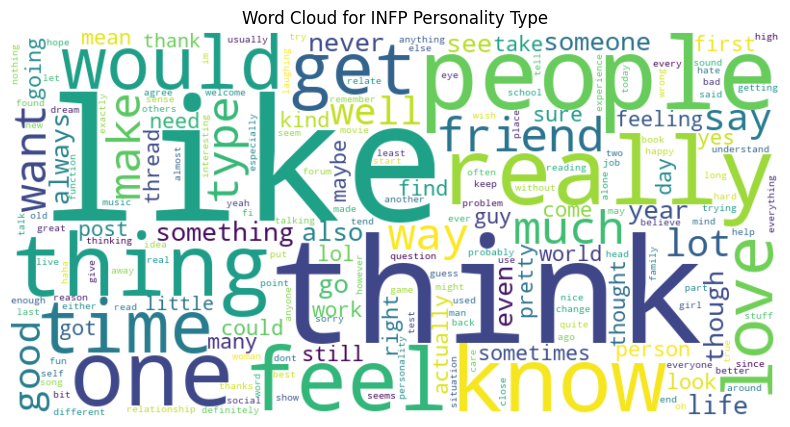

<Figure size 640x480 with 0 Axes>

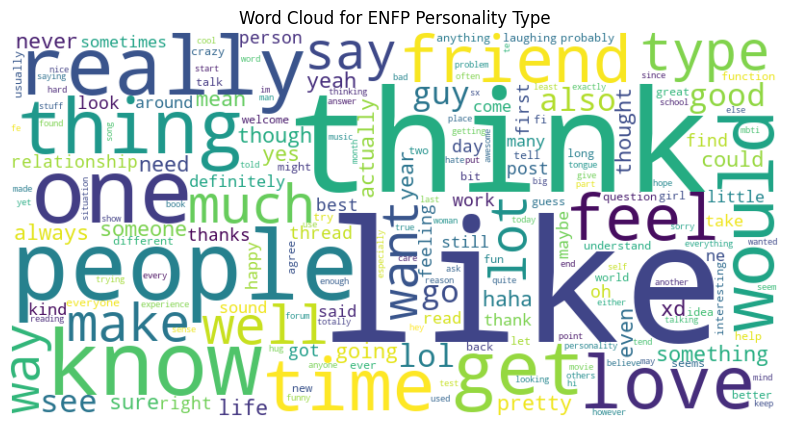

<Figure size 640x480 with 0 Axes>

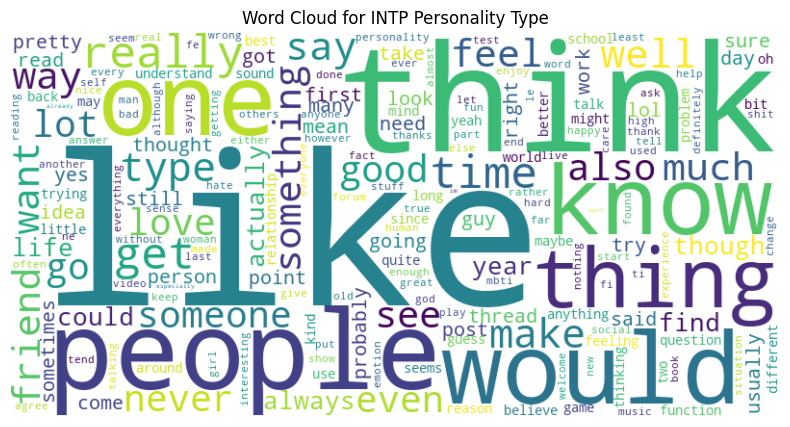

<Figure size 640x480 with 0 Axes>

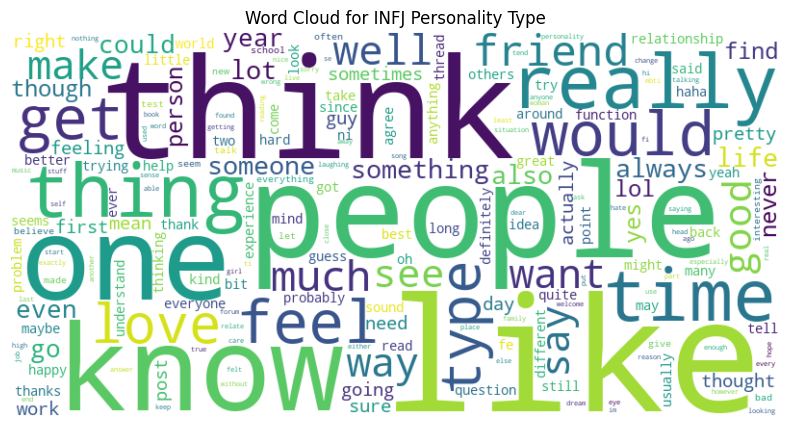

<Figure size 640x480 with 0 Axes>

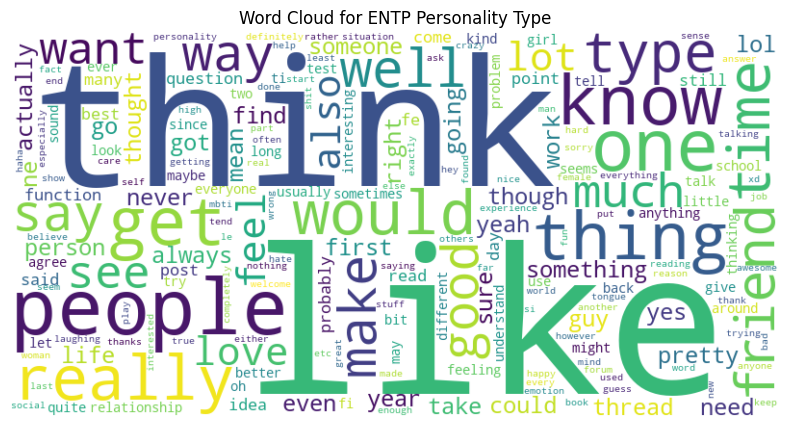

<Figure size 640x480 with 0 Axes>

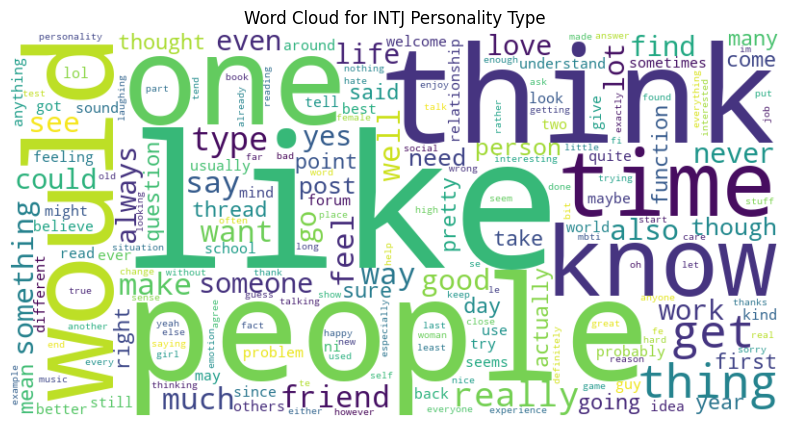

<Figure size 640x480 with 0 Axes>

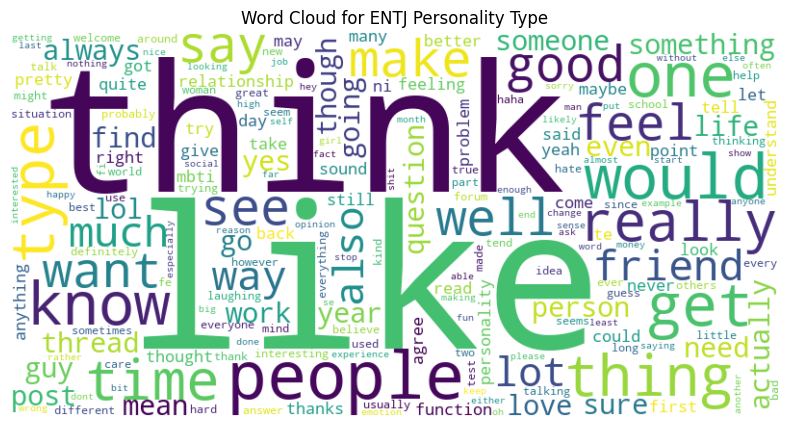

<Figure size 640x480 with 0 Axes>

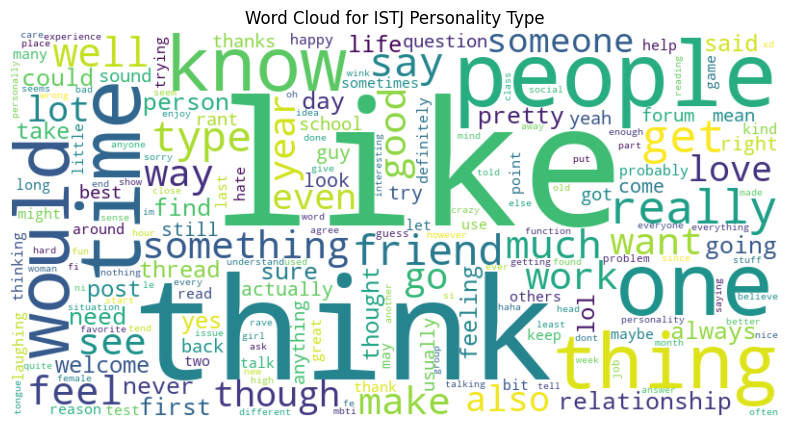

<Figure size 640x480 with 0 Axes>

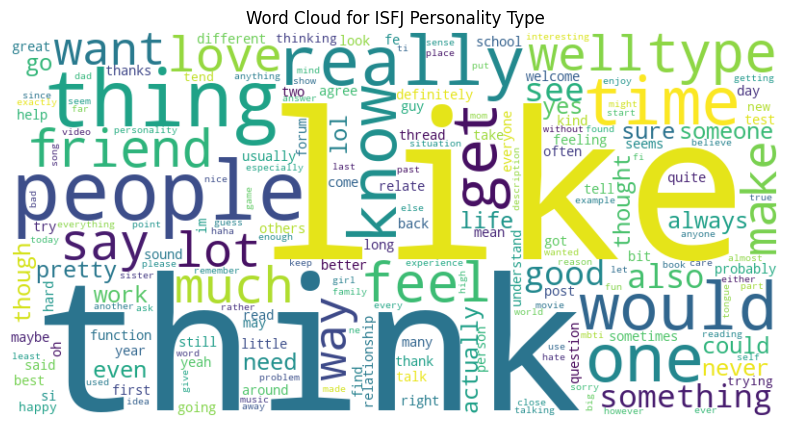

<Figure size 640x480 with 0 Axes>

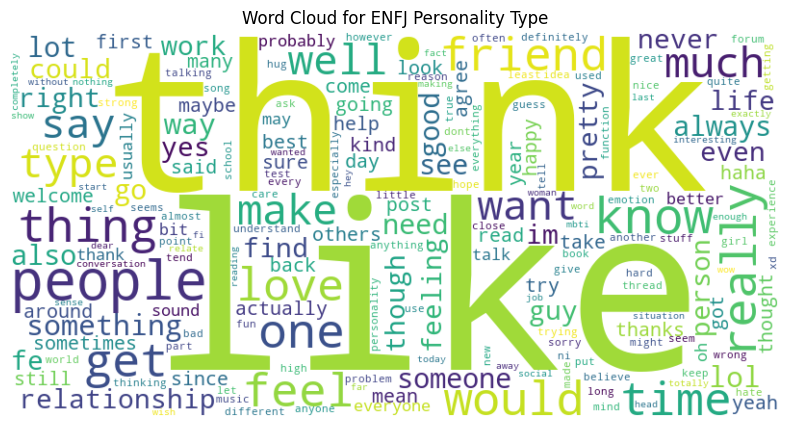

<Figure size 640x480 with 0 Axes>

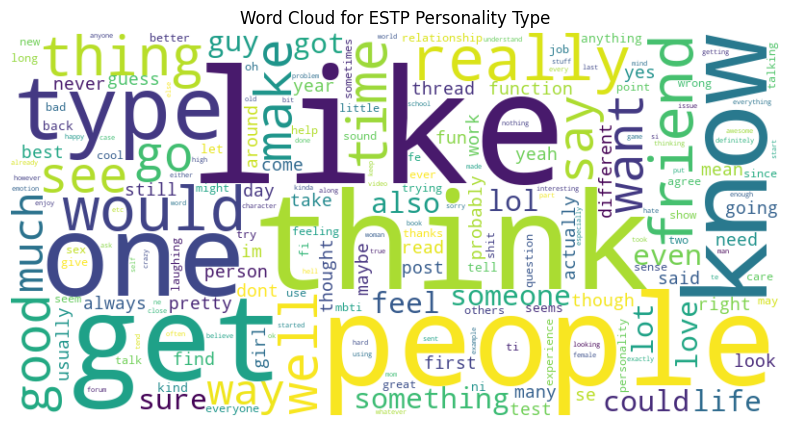

<Figure size 640x480 with 0 Axes>

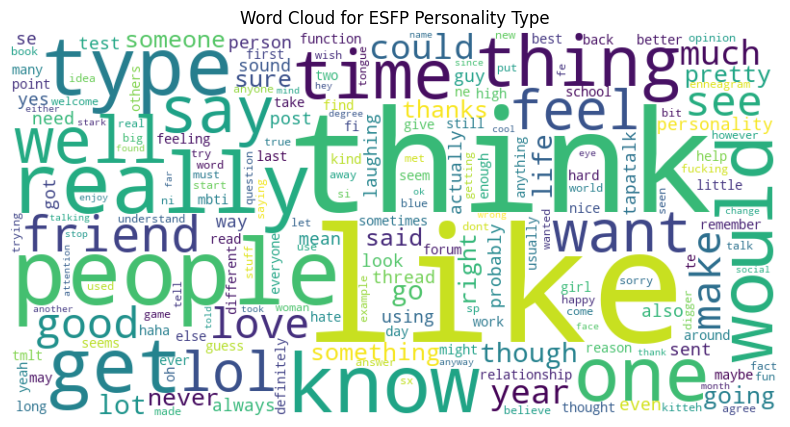

<Figure size 640x480 with 0 Axes>

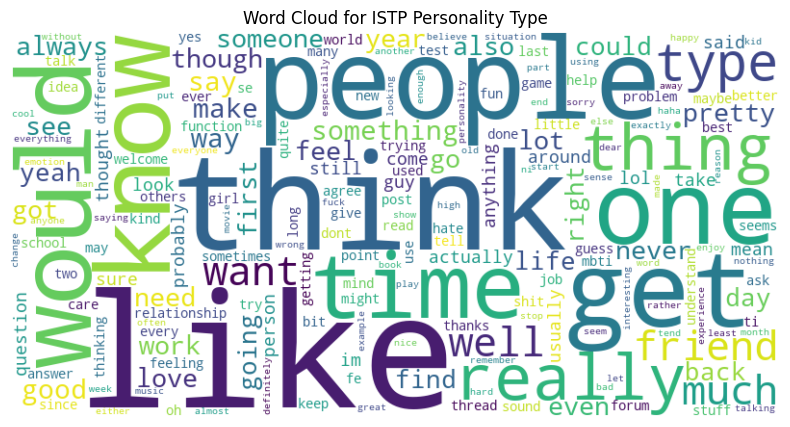

<Figure size 640x480 with 0 Axes>

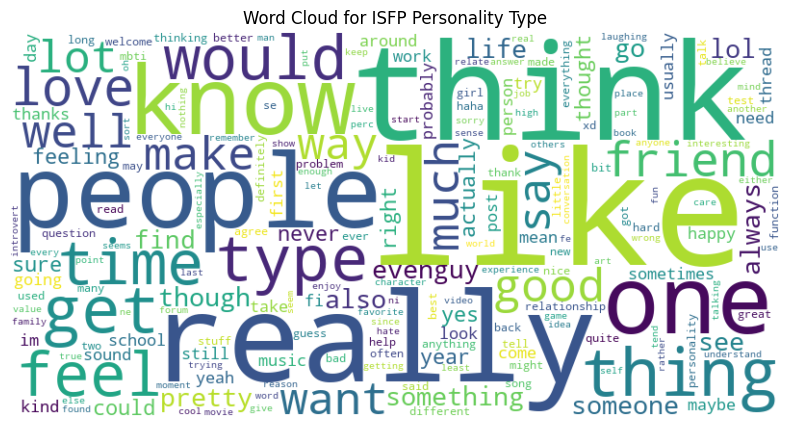

<Figure size 640x480 with 0 Axes>

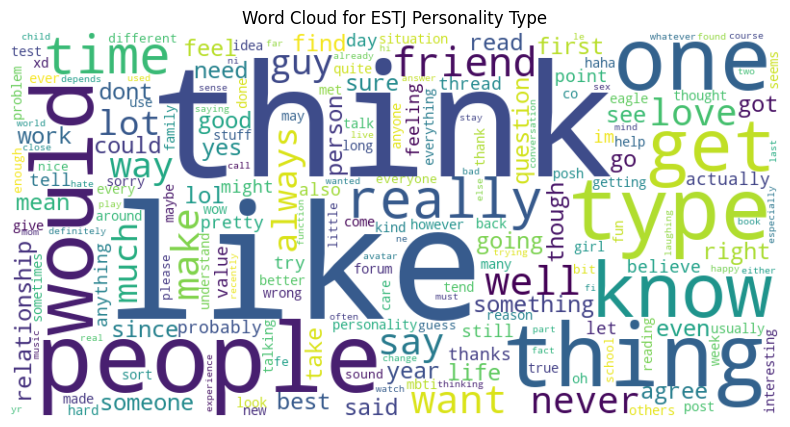

<Figure size 640x480 with 0 Axes>

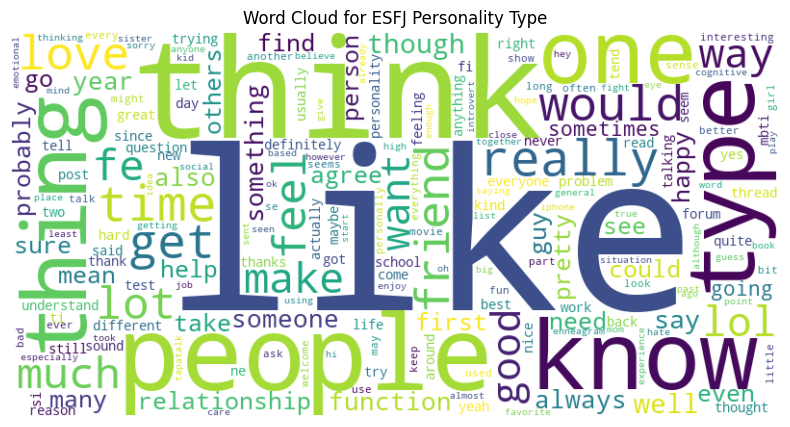

<Figure size 640x480 with 0 Axes>

In [ ]:
# for all the words
for mbti, scores in importantScoreList:
    mbti_str = str(mbti)
    wordCloud_plt = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(scores)
    
    plt.figure(figsize=(10,5))
    plt.imshow(wordCloud_plt, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {mbti_str} Personality Type')
    plt.show()
    plt.savefig(f'C:/Users/seren/OneDrive/Documents/datasets_3730/wordcloud/{mbti}.jpg')

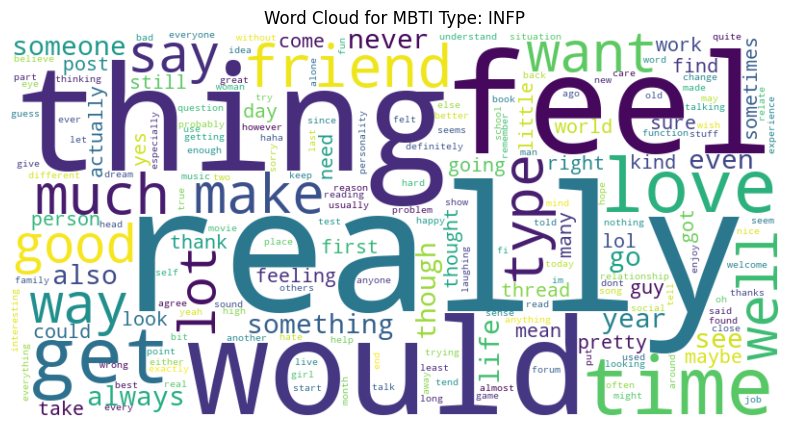

<Figure size 640x480 with 0 Axes>

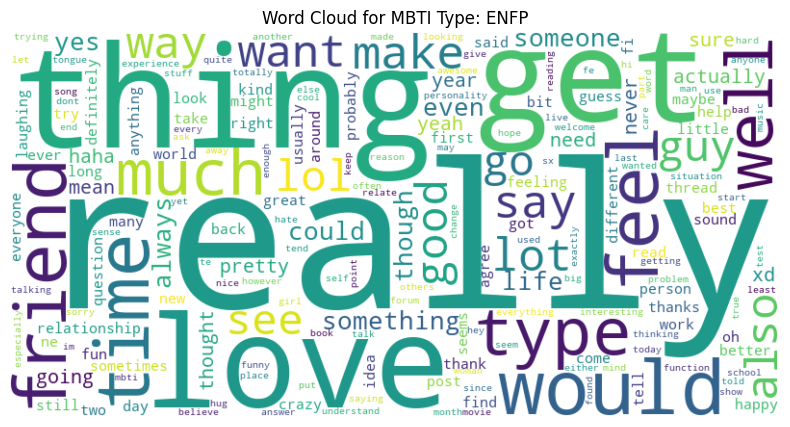

<Figure size 640x480 with 0 Axes>

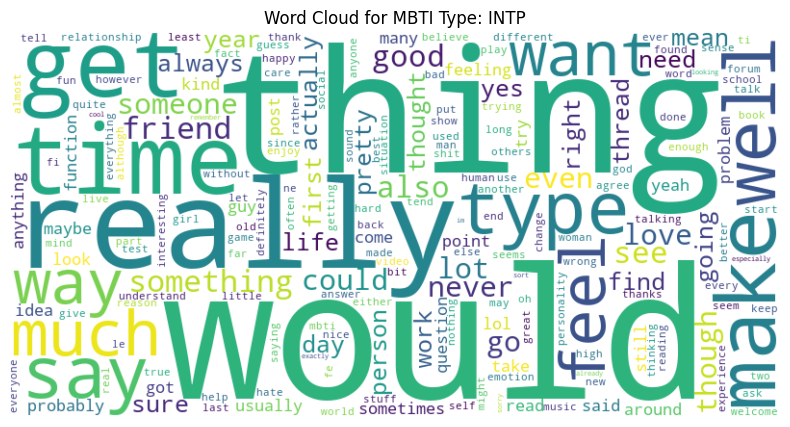

<Figure size 640x480 with 0 Axes>

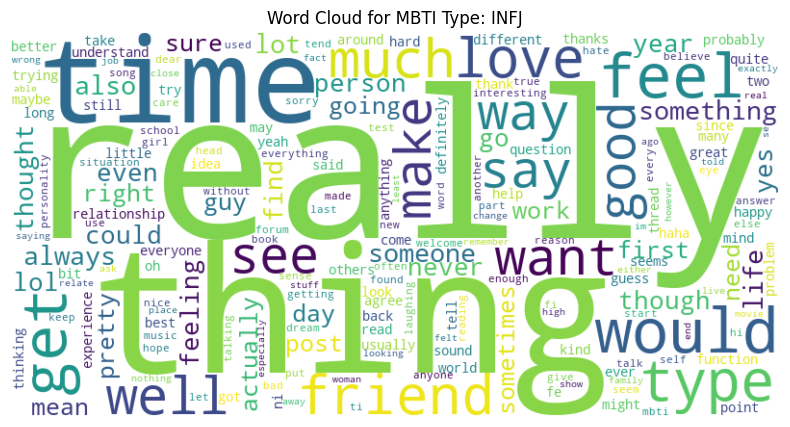

<Figure size 640x480 with 0 Axes>

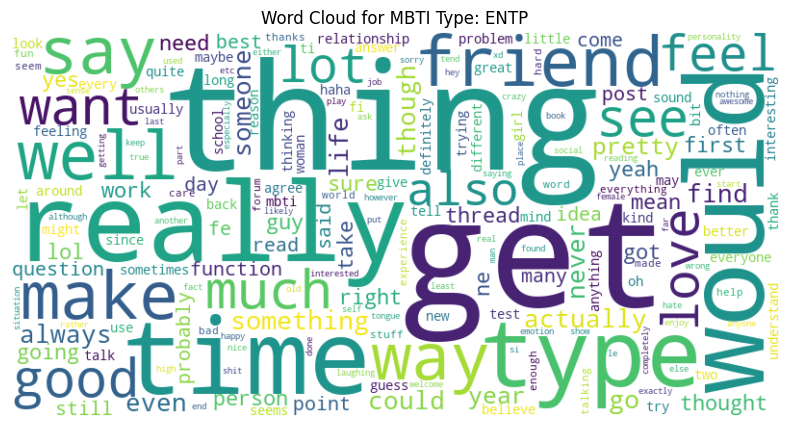

<Figure size 640x480 with 0 Axes>

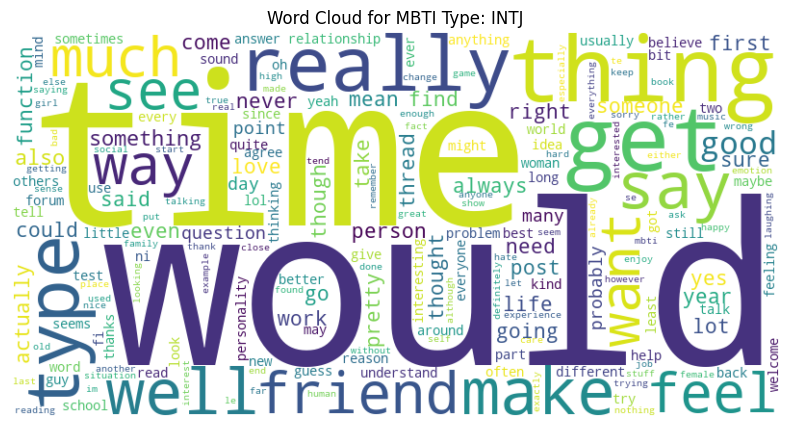

<Figure size 640x480 with 0 Axes>

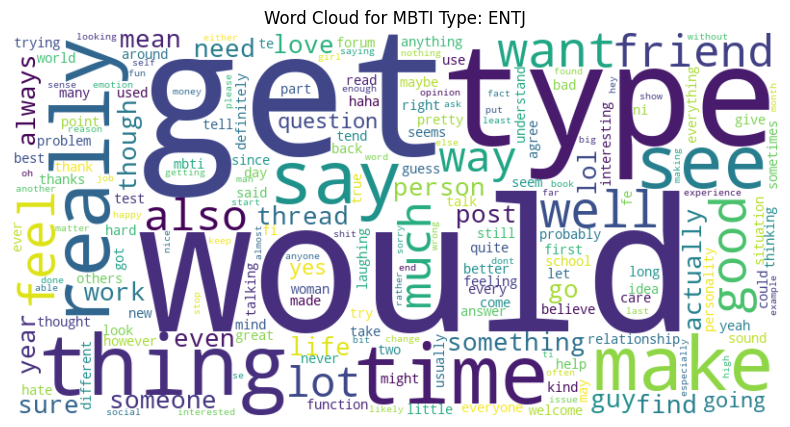

<Figure size 640x480 with 0 Axes>

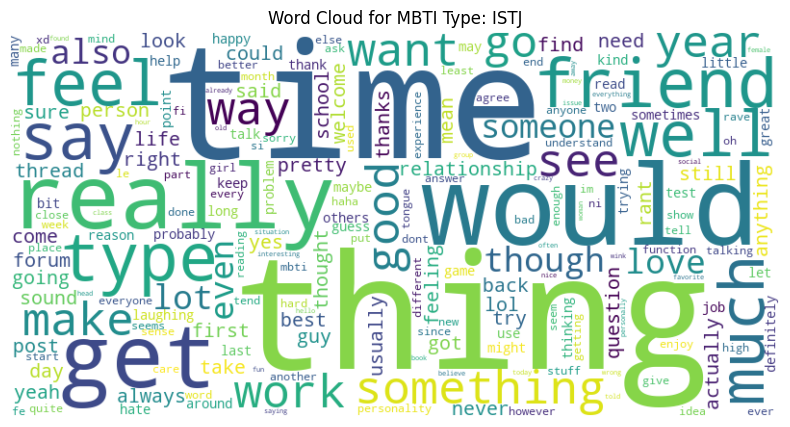

<Figure size 640x480 with 0 Axes>

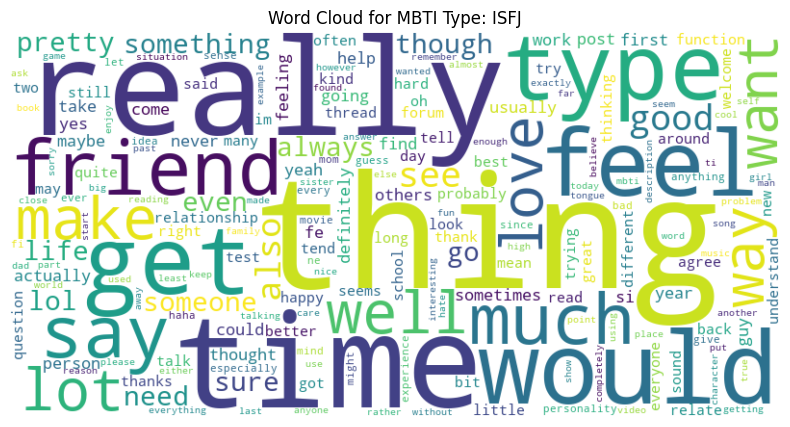

<Figure size 640x480 with 0 Axes>

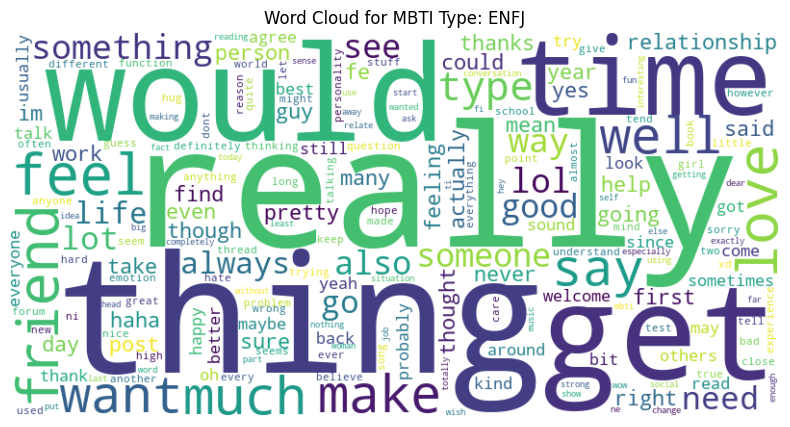

<Figure size 640x480 with 0 Axes>

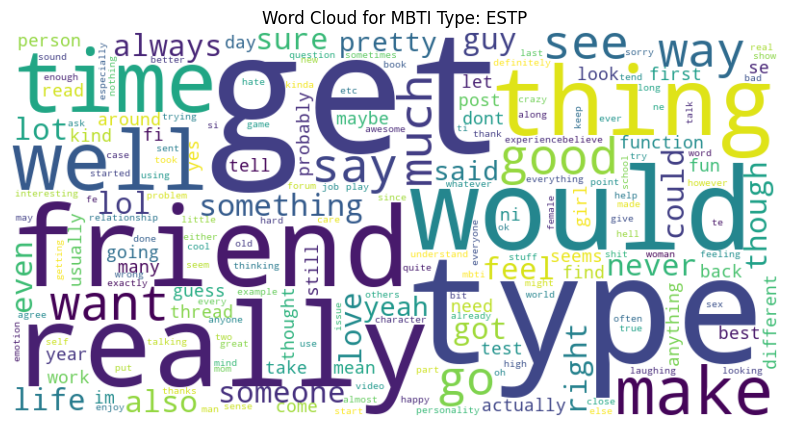

<Figure size 640x480 with 0 Axes>

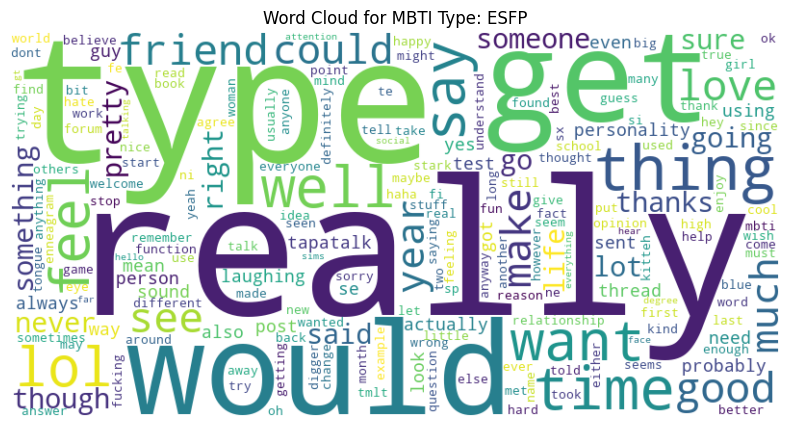

<Figure size 640x480 with 0 Axes>

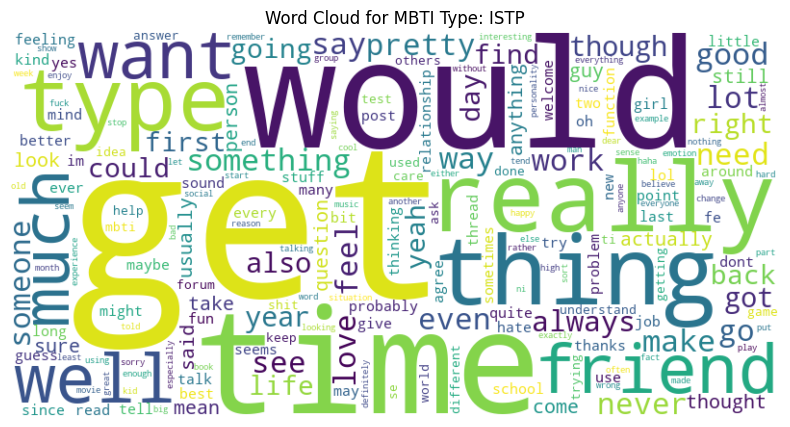

<Figure size 640x480 with 0 Axes>

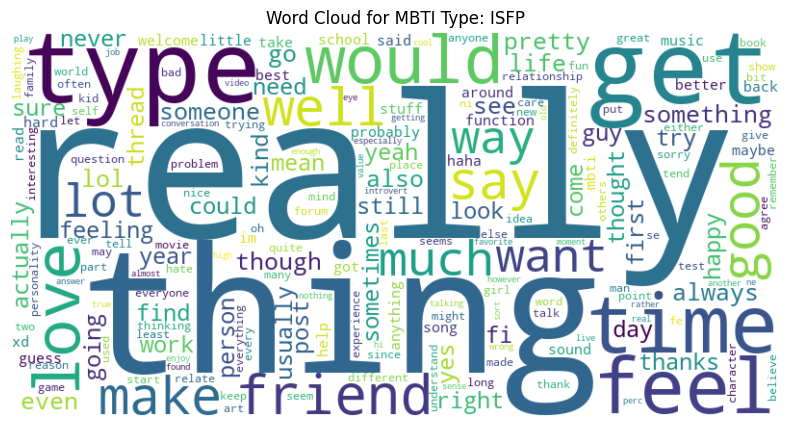

<Figure size 640x480 with 0 Axes>

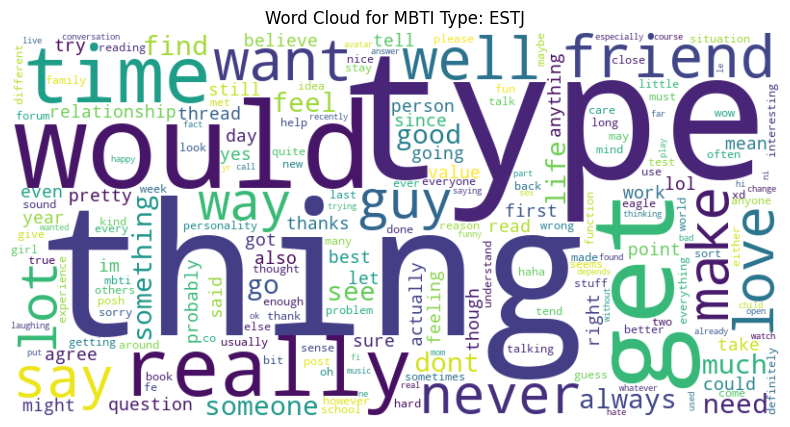

<Figure size 640x480 with 0 Axes>

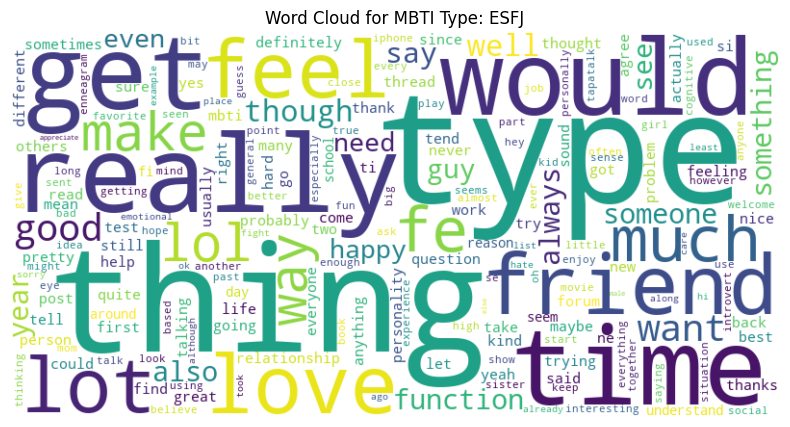

<Figure size 640x480 with 0 Axes>

In [ ]:
# List of words to remove
words_to_remove = ['think', 'like', 'one', 'people', 'know']

for mbti, importance_scores in importantScoreList:
    
    importance_scores_filtered = {word: importance for word, importance in importance_scores.items() if word.lower() not in words_to_remove}
    mbti_str = str(mbti)

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(importance_scores_filtered)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title('Word Cloud for MBTI Type: ' + mbti_str)  # Concatenate the string
    plt.axis('off')
    plt.show()
    plt.savefig(f'C:/Users/seren/OneDrive/Documents/datasets_3730/wordcloud_removed/{mbti}_rm.jpg')


#### Bar Graph

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

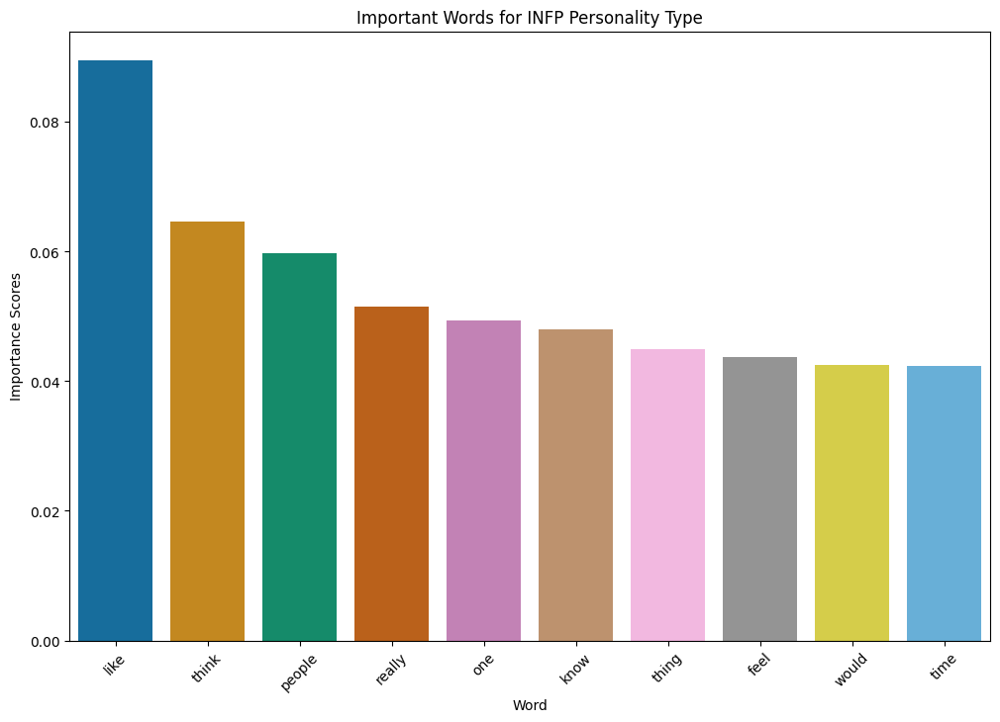

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

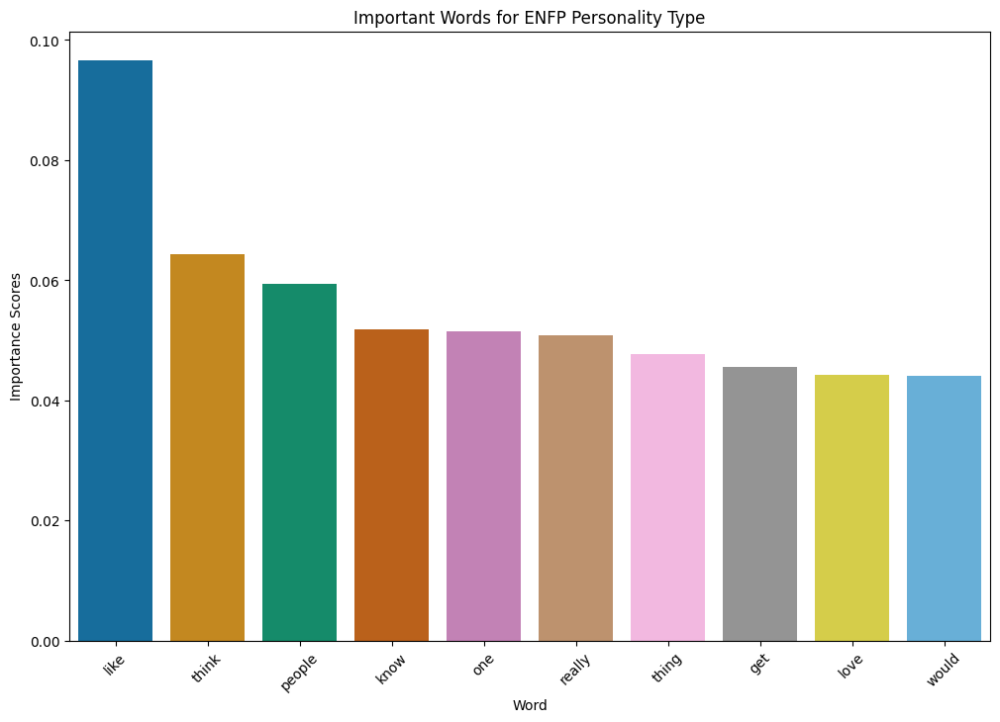

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

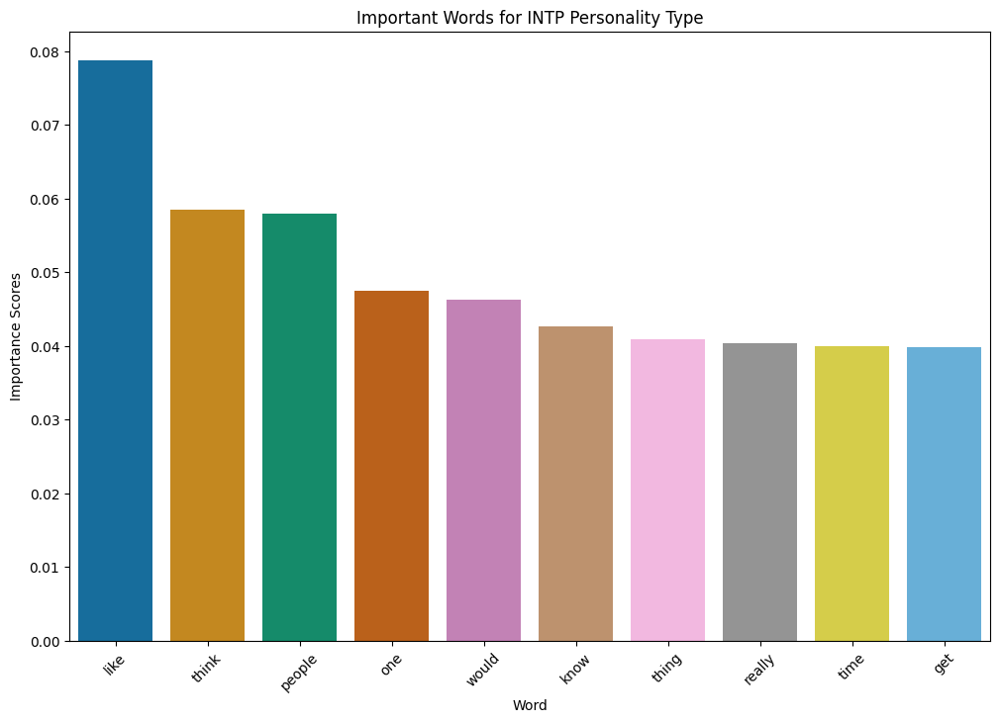

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

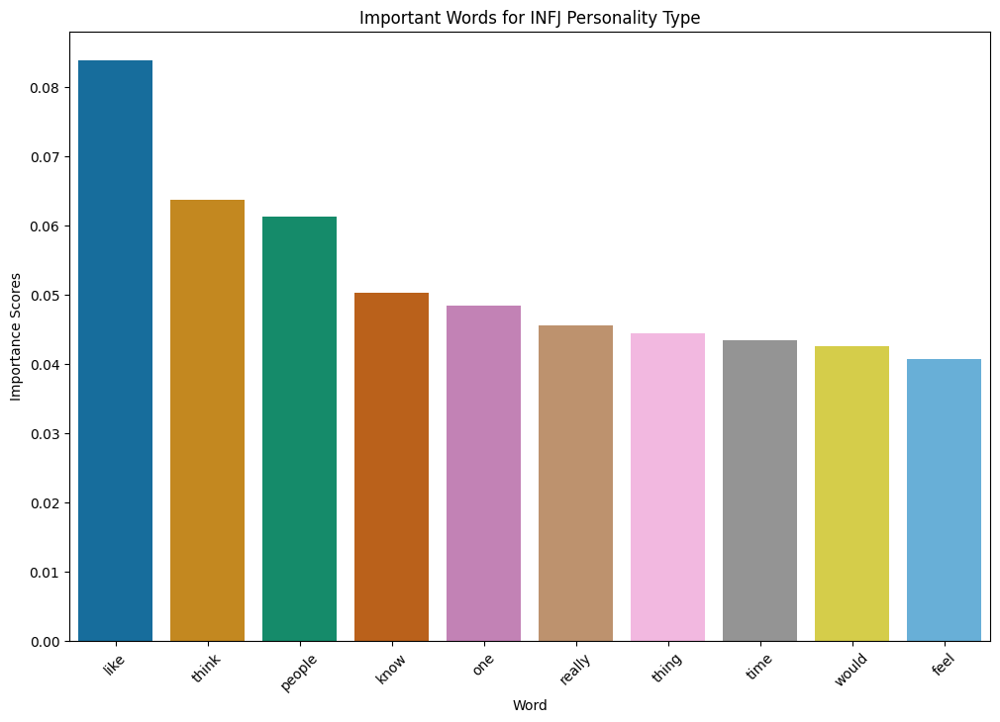

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

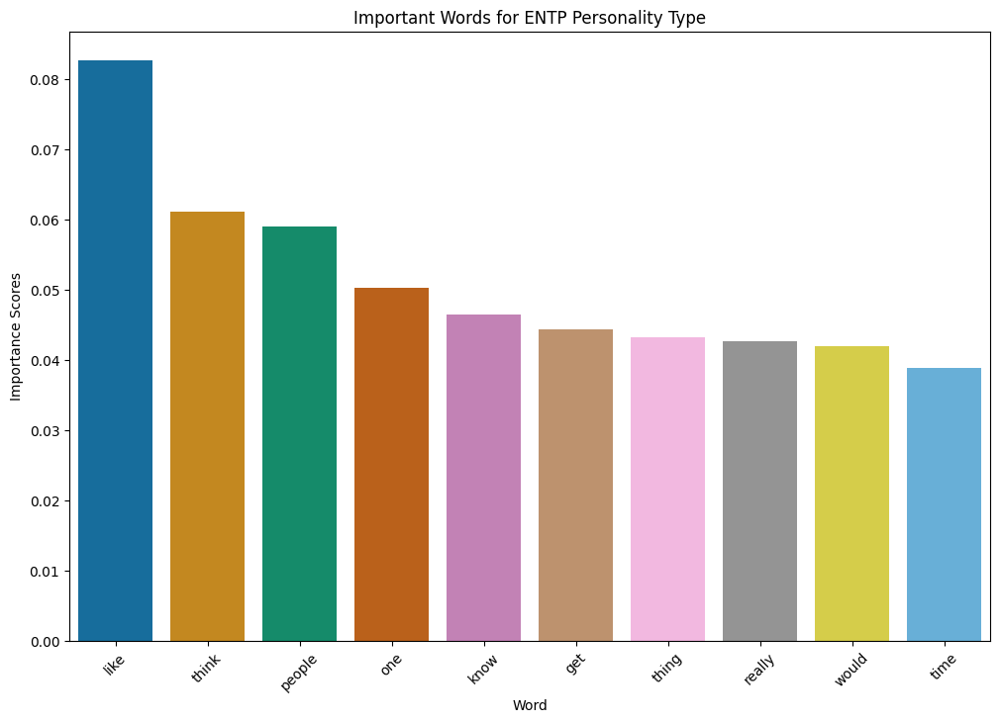

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

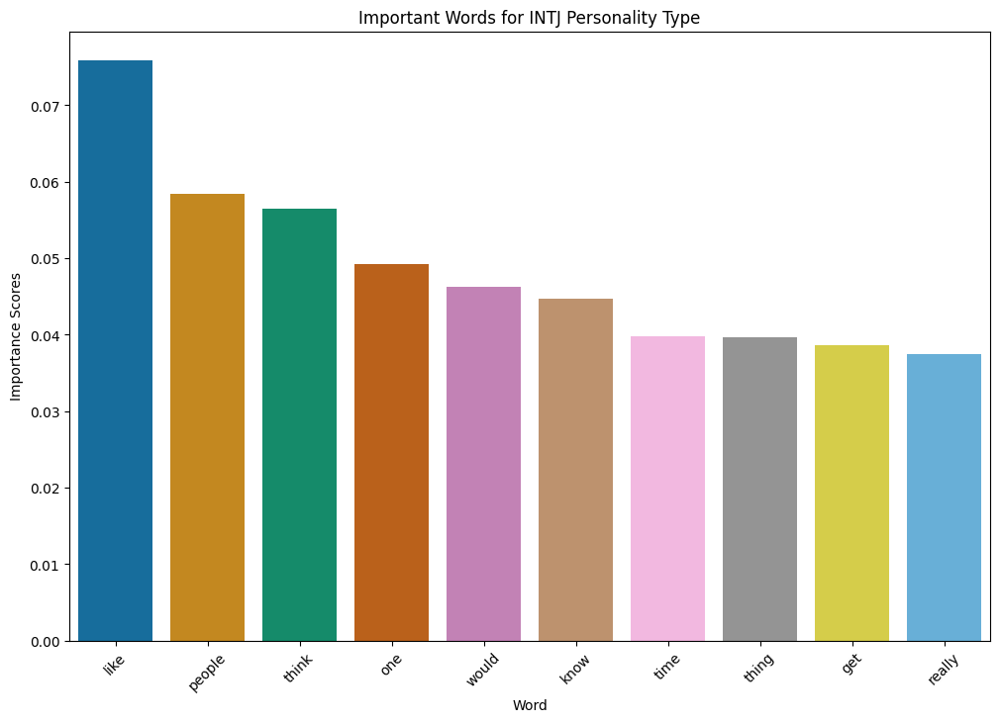

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

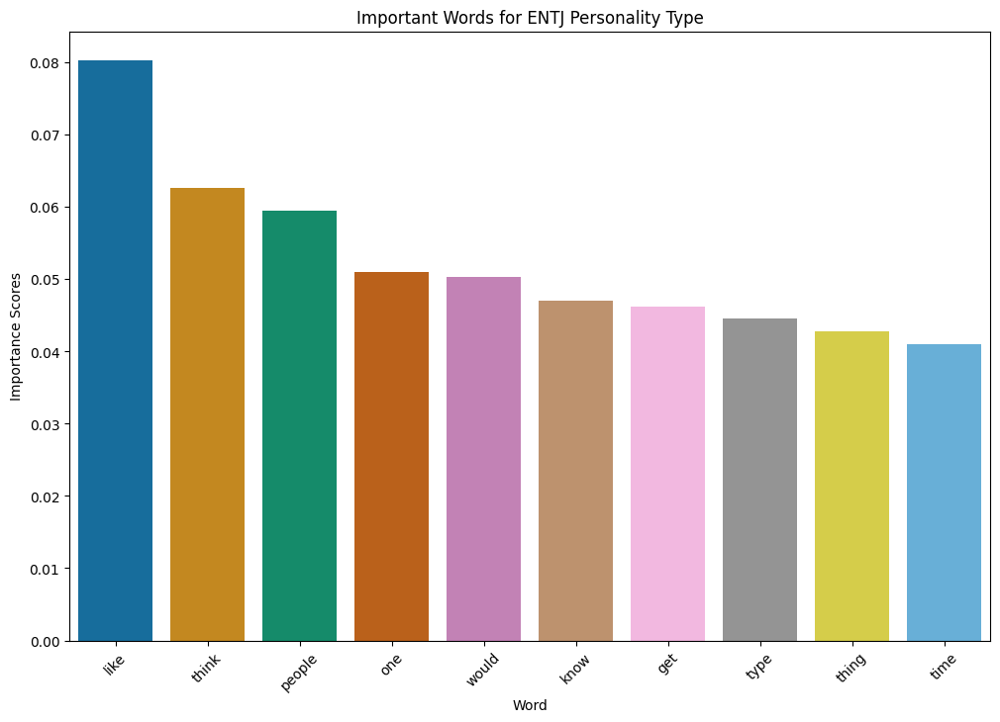

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

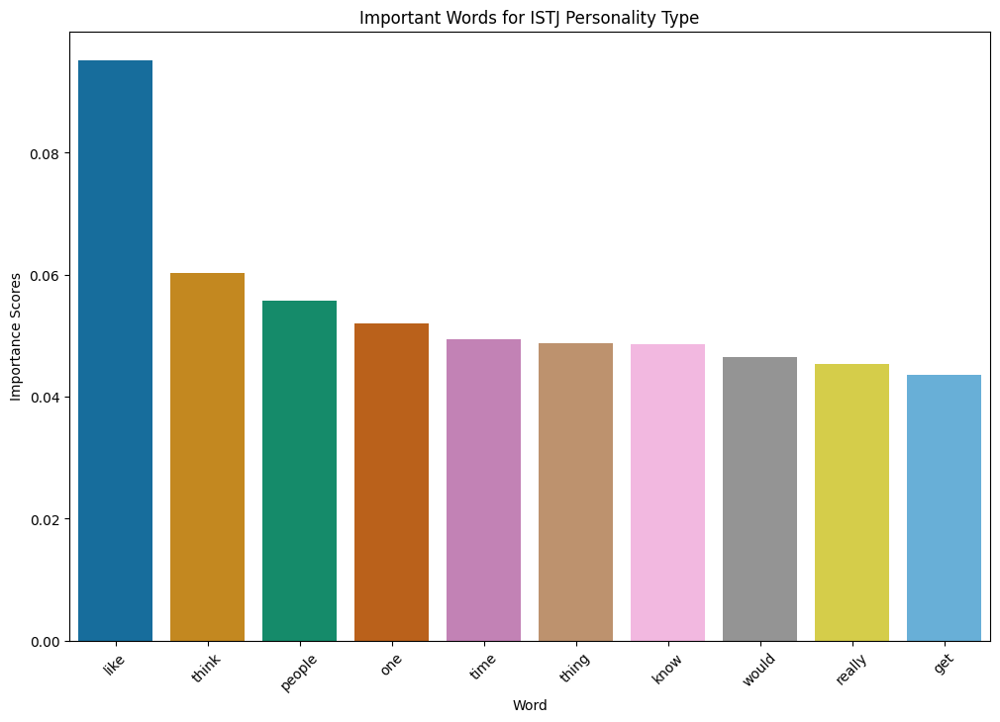

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

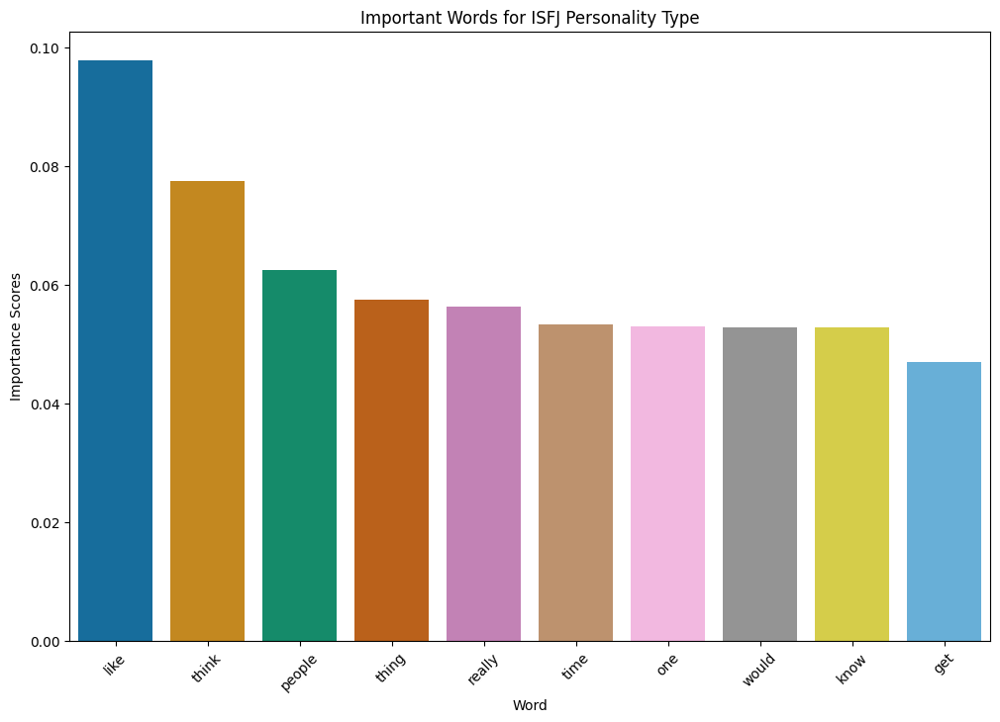

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

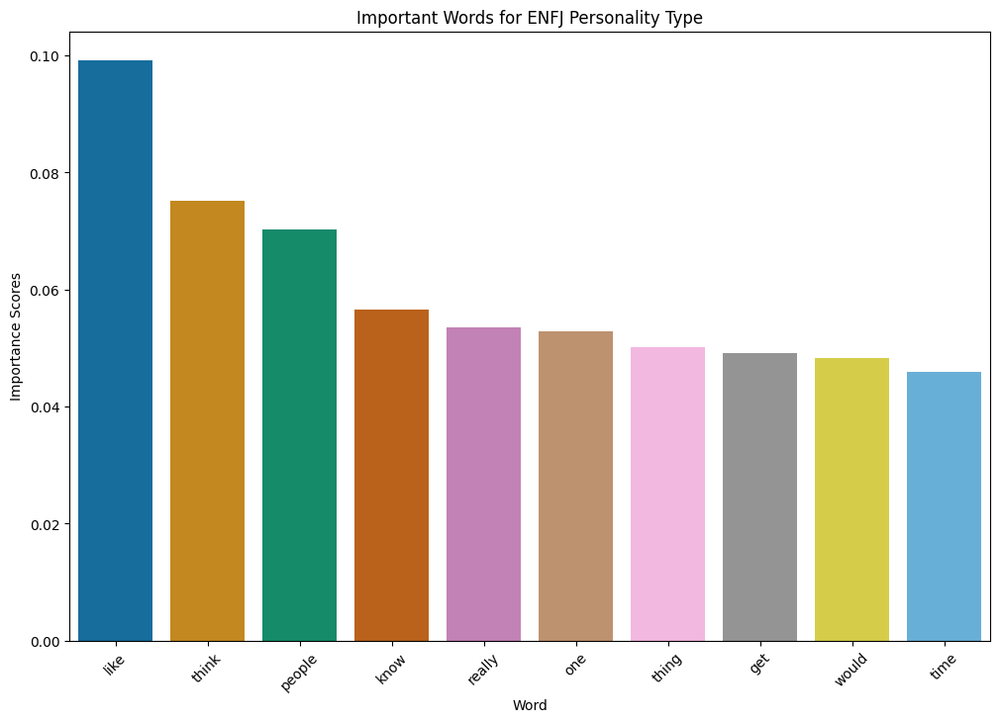

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

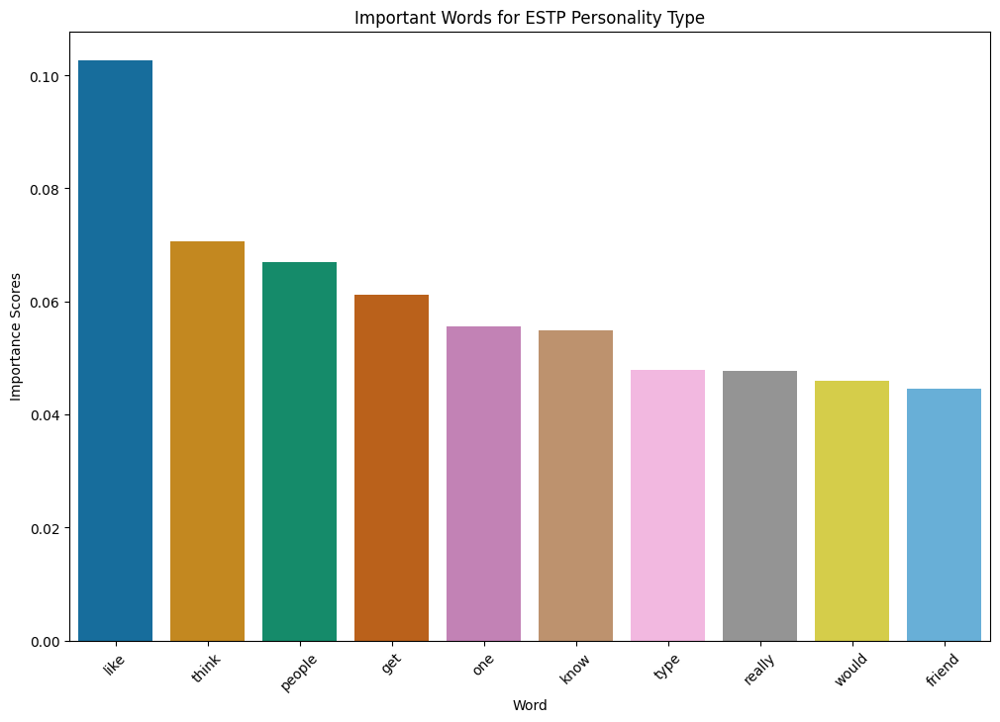

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

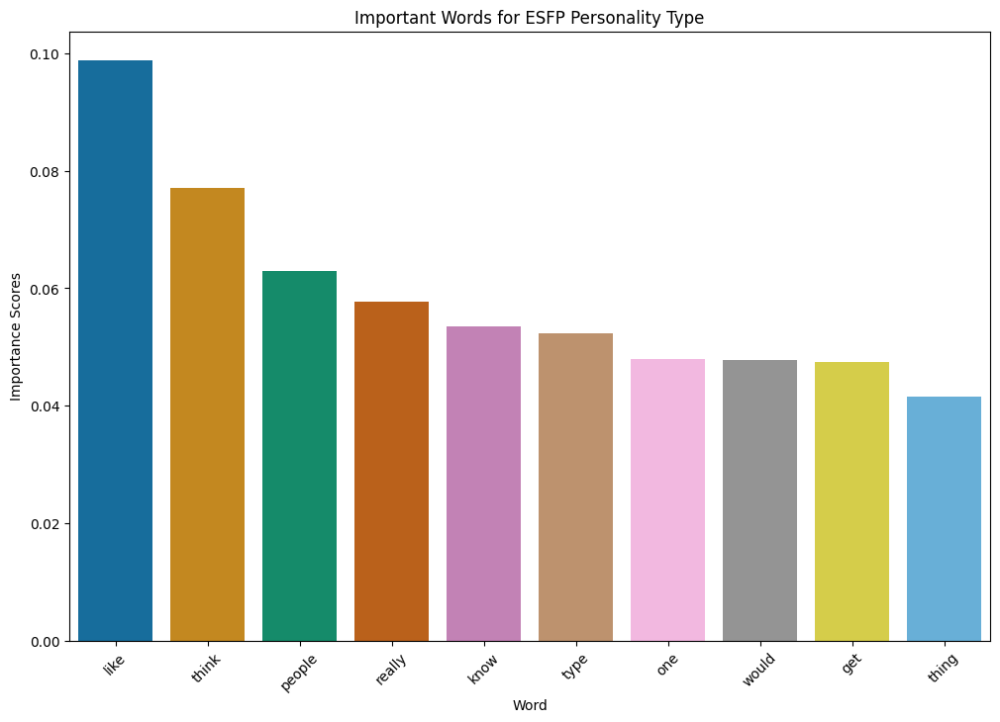

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

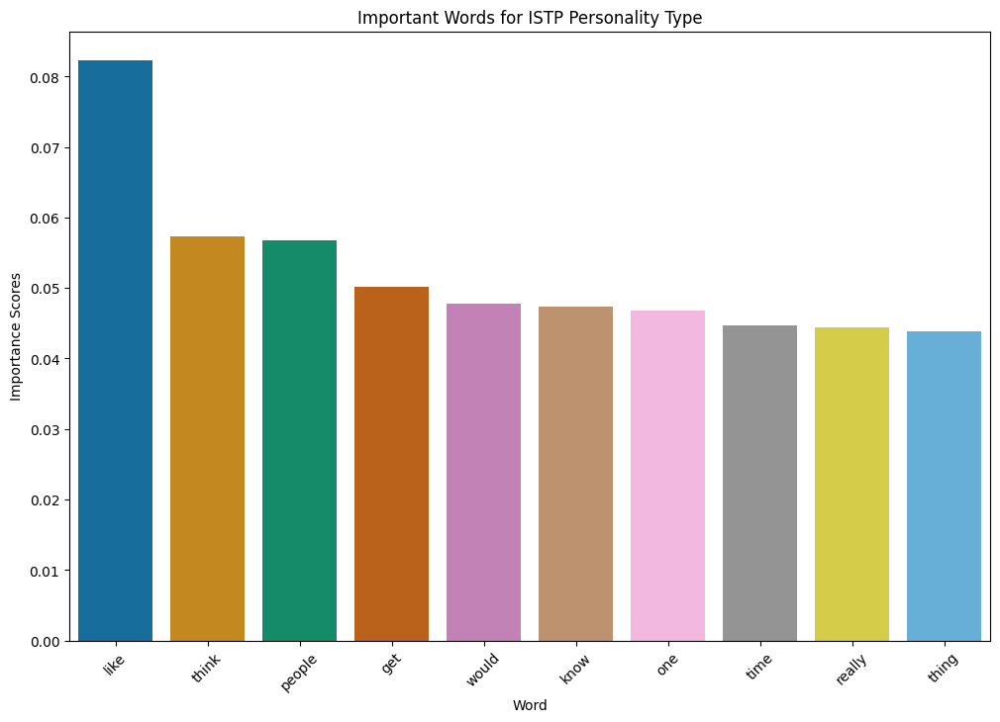

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

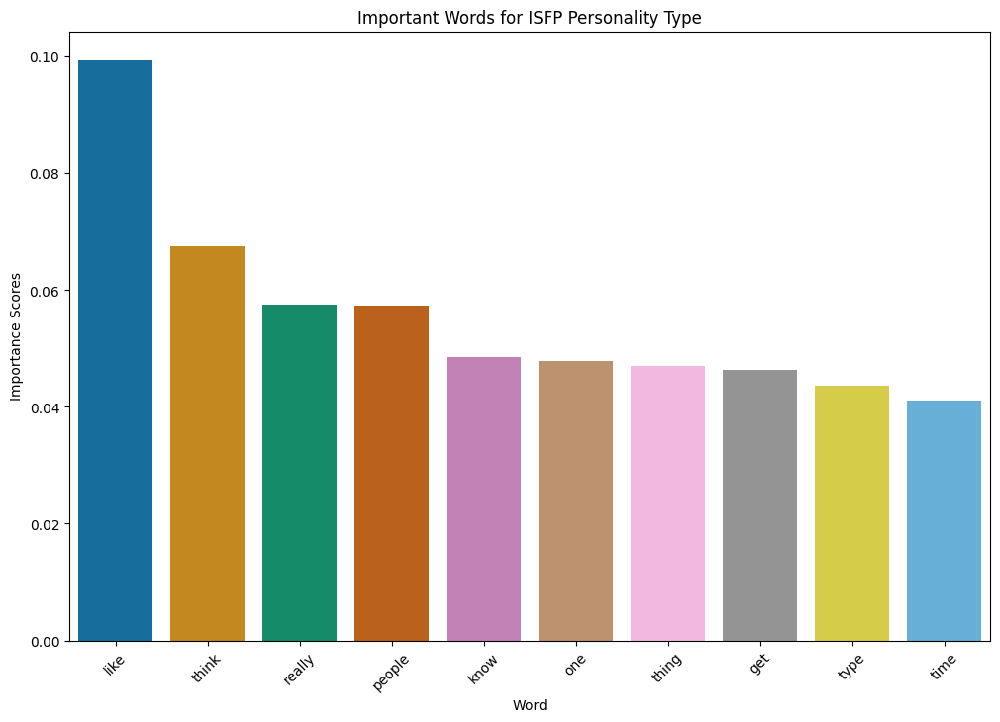

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

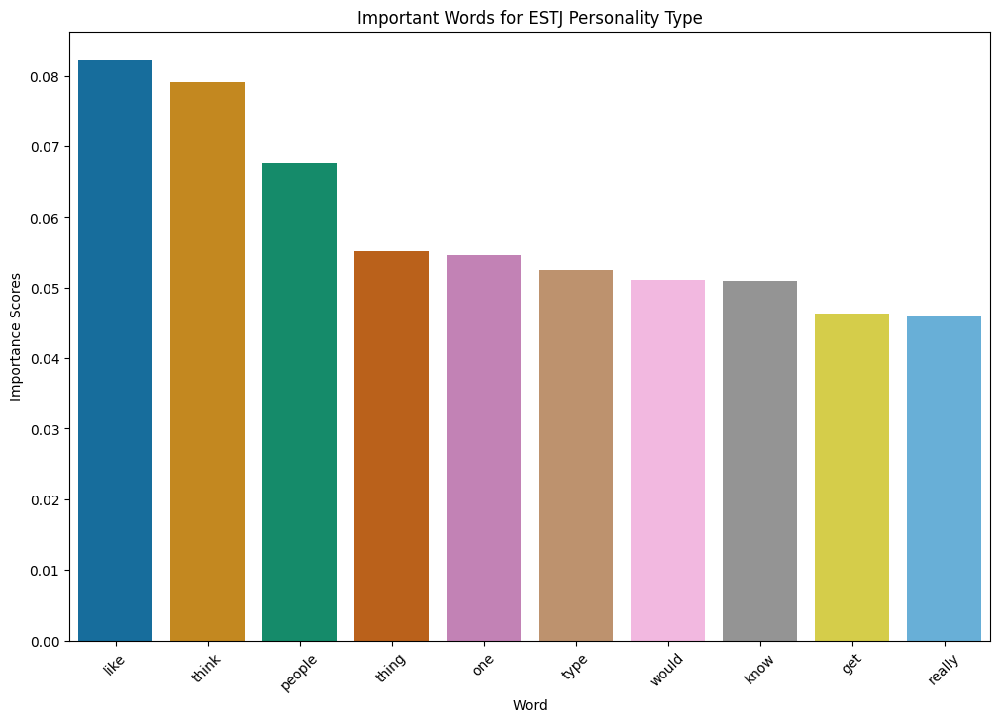

C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Figure size 640x480 with 0 Axes>

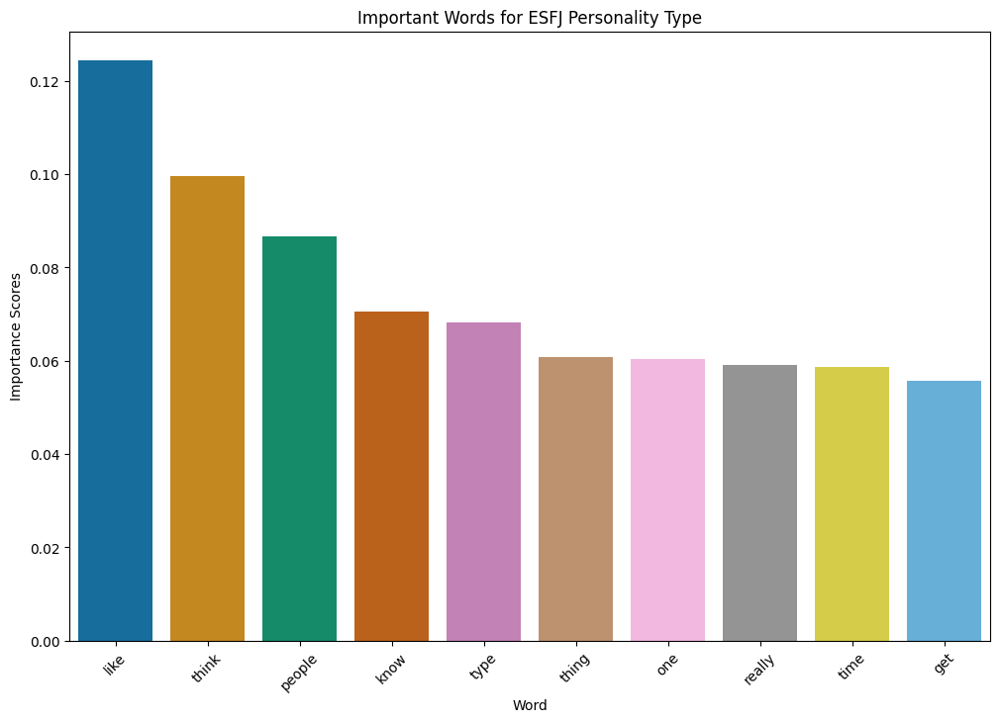

<Figure size 640x480 with 0 Axes>

In [ ]:
for mbti, scores in importantScoreList:
    mbti_str = str(mbti)
    important_df = pd.DataFrame(list(scores.items()), columns=['Word', 'ImportanceScores'])
    important_df = important_df.sort_values(by='ImportanceScores', ascending=False)

    important_topTen_df = important_df.head(10)

    plt.figure(figsize=(12,8))
    # plt.bar(important_topTen_df['Word'], important_topTen_df['ImportanceScores'])
    sns.barplot(x='Word', y='ImportanceScores', data=important_topTen_df, palette='colorblind')
    plt.xlabel('Word')
    plt.ylabel('Importance Scores')
    plt.title(f'Important Words for {mbti_str} Personality Type')
    plt.xticks(rotation = 45)
    plt.show()
    plt.savefig(f'C:/Users/seren/OneDrive/Documents/datasets_3730/topTen_bar/{mbti}_bar.jpg')

### Classification v. Frequency Plots

In [17]:
I_count = I['type'].sum()
E_count = E['type'].sum()

N_count = N['type'].sum()
S_count = S['type'].sum()

F_count = F['type'].sum()
T_count = T['type'].sum()

J_count = J['type'].sum()
P_count = P['type'].sum()

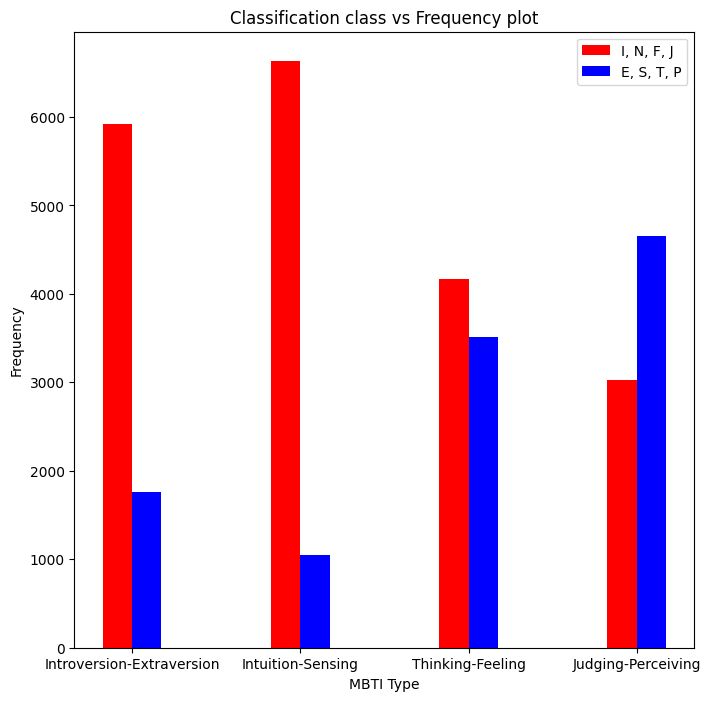

In [18]:
plt.figure(figsize=(8, 8))

categories = ['Introversion-Extraversion', 'Intuition-Sensing', 'Thinking-Feeling', 'Judging-Perceiving']
coordinates = np.arange(len(categories)) * 2
width = 0.35  # Width of the bars

# Bar plot for I, N, F, J
plt.bar(coordinates - width/2, [I_count, N_count, F_count, J_count], width, label="I, N, F, J", color='red')

# Bar plot for E, S, T, P
plt.bar(coordinates + width/2, [E_count, S_count, T_count, P_count], width, label="E, S, T, P", color='blue')

plt.legend()
plt.title('Classification class vs Frequency plot')
plt.xlabel('MBTI Type')
plt.ylabel('Frequency')
plt.xticks(coordinates, categories)

plt.show()


### Training and Testing

In [16]:
x_train_ie, x_test_ie, y_train_ie, y_test_ie = train_test_split(features_df, new_mbti_df['IvE'], test_size=0.3, random_state=123)
x_train_ns, x_test_ns, y_train_ns, y_test_ns = train_test_split(features_df, new_mbti_df['NvS'], test_size=0.3, random_state=123)
x_train_ft, x_test_ft, y_train_ft, y_test_ft = train_test_split(features_df, new_mbti_df['FvT'], test_size=0.3, random_state=123)
x_train_pj, x_test_pj, y_train_pj, y_test_pj = train_test_split(features_df, new_mbti_df['PvJ'], test_size=0.3, random_state=123)

### Applying Machine Learning Algorithms

#### Naive Bayes Model

In [113]:
naive_bayes = MultinomialNB()

In [114]:
nb_grid_search_ie = GridSearchCV(naive_bayes, {}, cv=5)

y_nb_ie = nb_grid_search_ie.fit(x_train_ie, y_train_ie).best_estimator_.predict(x_test_ie)
print(f'\nPrediction: {y_nb_ie}')

print(classification_report(y_test_ie, y_pred=y_nb_ie))

acc_nb_ie = accuracy_score(y_test_ie, y_pred=y_nb_ie)
print(f'\nAccuracy Score: {acc_nb_ie}')


Prediction: ['I' 'I' 'I' ... 'I' 'I' 'I']
              precision    recall  f1-score   support

           E       0.00      0.00      0.00       535
           I       0.77      1.00      0.87      1769

    accuracy                           0.77      2304
   macro avg       0.38      0.50      0.43      2304
weighted avg       0.59      0.77      0.67      2304


Accuracy Score: 0.7677951388888888


C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471

<Figure size 640x480 with 0 Axes>

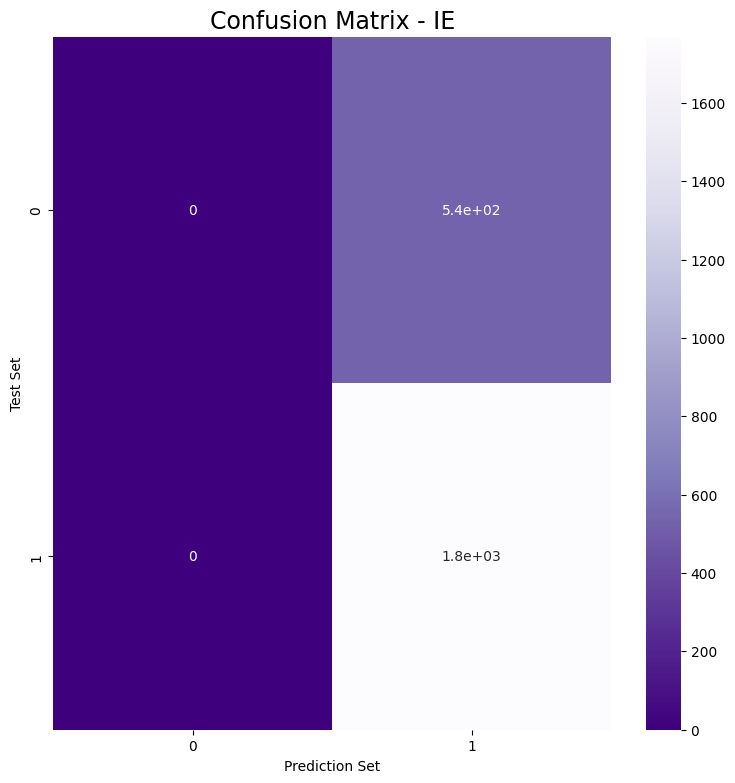

In [115]:
plt.figure()
plt.figure(figsize=(9,9))
confusion_Matrix = metrics.confusion_matrix(y_test_ie, y_nb_ie)
sns.heatmap(confusion_Matrix, annot=True, cmap='Purples_r')
plt.ylabel('Test Set')
plt.xlabel('Prediction Set')
plt.title('Confusion Matrix - IE', size=17)
plt.show()

In [116]:
nb_grid_search_ns = GridSearchCV(naive_bayes, {}, cv=5)

y_nb_ns = nb_grid_search_ns.fit(x_train_ns, y_train_ns).best_estimator_.predict(x_test_ns)
print(f'\nPrediction: {y_nb_ns}')

print(classification_report(y_test_ns, y_pred=y_nb_ns))

acc_nb_ns = accuracy_score(y_test_ns, y_pred=y_nb_ns)
print(f'\nAccuracy Score: {acc_nb_ns}')


Prediction: ['N' 'N' 'N' ... 'N' 'N' 'N']
              precision    recall  f1-score   support

           N       0.86      1.00      0.93      1983
           S       0.00      0.00      0.00       321

    accuracy                           0.86      2304
   macro avg       0.43      0.50      0.46      2304
weighted avg       0.74      0.86      0.80      2304


Accuracy Score: 0.8606770833333334


C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471

<Figure size 640x480 with 0 Axes>

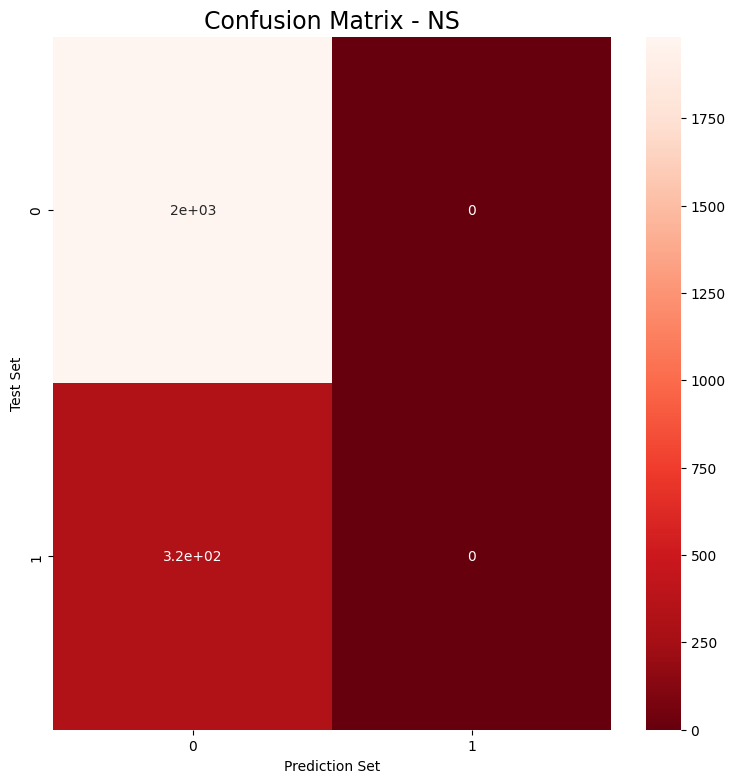

In [117]:
plt.figure()
plt.figure(figsize=(9,9))
confusion_Matrix = metrics.confusion_matrix(y_test_ns, y_nb_ns)
sns.heatmap(confusion_Matrix, annot=True, cmap='Reds_r')
plt.ylabel('Test Set')
plt.xlabel('Prediction Set')
plt.title('Confusion Matrix - NS', size=17)
plt.show()

In [118]:
nb_grid_search_ft = GridSearchCV(naive_bayes, {}, cv=5)

y_nb_ft = nb_grid_search_ft.fit(x_train_ft, y_train_ft).best_estimator_.predict(x_test_ft)
print(f'\nPrediction: {y_nb_ft}')

print(classification_report(y_test_ft, y_pred=y_nb_ft))

acc_nb_ft = accuracy_score(y_test_ft, y_pred=y_nb_ft)
print(f'\nAccuracy Score: {acc_nb_ft}')


Prediction: ['F' 'F' 'F' ... 'F' 'F' 'F']
              precision    recall  f1-score   support

           F       0.57      0.99      0.72      1278
           T       0.88      0.06      0.11      1026

    accuracy                           0.58      2304
   macro avg       0.73      0.53      0.42      2304
weighted avg       0.71      0.58      0.45      2304


Accuracy Score: 0.5772569444444444


<Figure size 640x480 with 0 Axes>

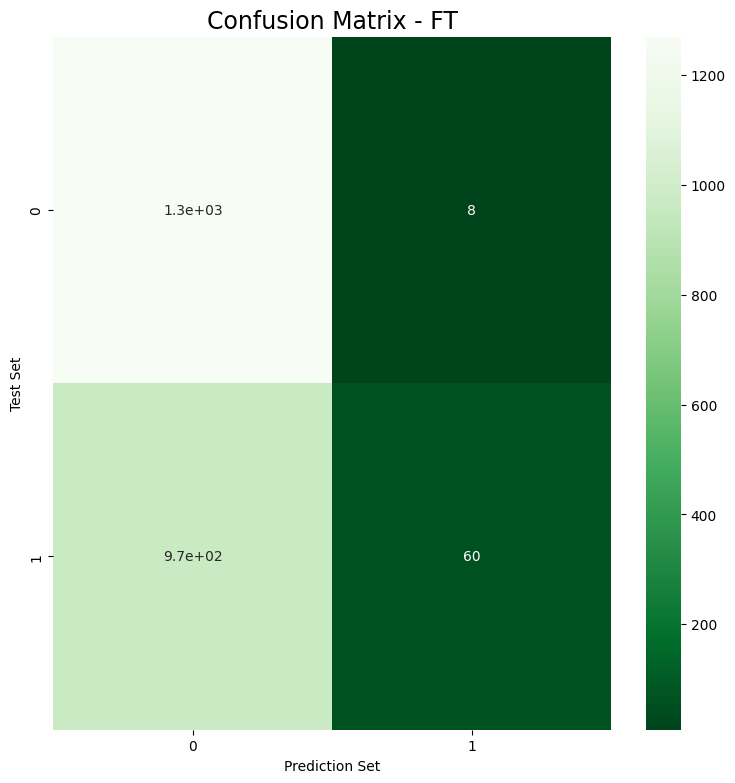

In [119]:
plt.figure()
plt.figure(figsize=(9,9))
confusion_Matrix = metrics.confusion_matrix(y_test_ft, y_nb_ft)
sns.heatmap(confusion_Matrix, annot=True, cmap='Greens_r')
plt.ylabel('Test Set')
plt.xlabel('Prediction Set')
plt.title('Confusion Matrix - FT', size=17)
plt.show()

In [120]:
nb_grid_search_pj = GridSearchCV(naive_bayes, {}, cv=5)

y_nb_pj = nb_grid_search_pj.fit(x_train_pj, y_train_pj).best_estimator_.predict(x_test_pj)
print(f'\nPrediction: {y_nb_pj}')

print(classification_report(y_test_pj, y_pred=y_nb_pj))

acc_nb_pj = accuracy_score(y_test_pj, y_pred=y_nb_pj)
print(f'\nAccuracy Score: {acc_nb_pj}')


Prediction: ['P' 'P' 'P' ... 'P' 'P' 'P']
              precision    recall  f1-score   support

           J       0.00      0.00      0.00       920
           P       0.60      1.00      0.75      1384

    accuracy                           0.60      2304
   macro avg       0.30      0.50      0.38      2304
weighted avg       0.36      0.60      0.45      2304


Accuracy Score: 0.6006944444444444


C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471

<Figure size 640x480 with 0 Axes>

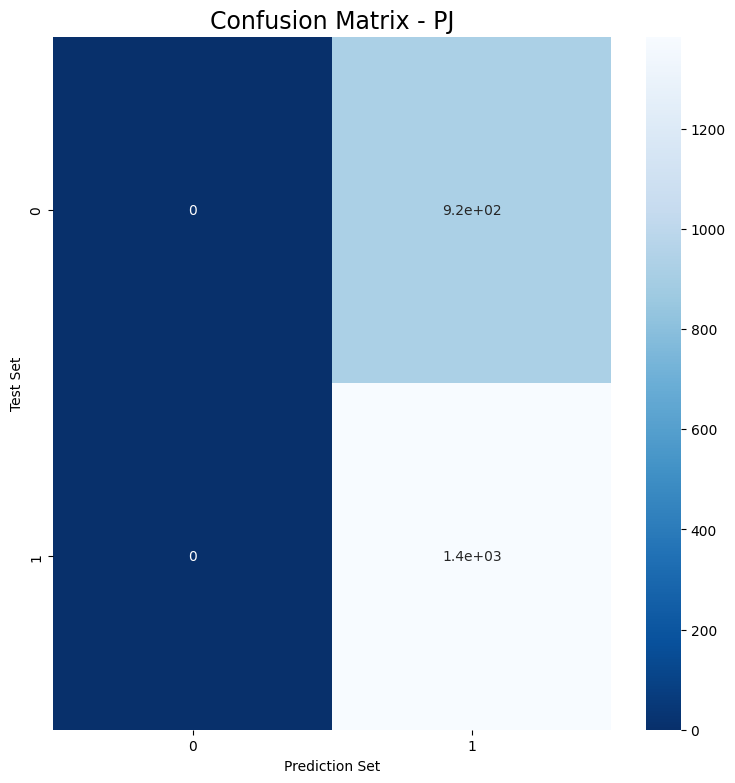

In [121]:
plt.figure()
plt.figure(figsize=(9,9))
confusion_Matrix = metrics.confusion_matrix(y_test_pj, y_nb_pj)
sns.heatmap(confusion_Matrix, annot=True, cmap='Blues_r')
plt.ylabel('Test Set')
plt.xlabel('Prediction Set')
plt.title('Confusion Matrix - PJ', size=17)
plt.show()

#### Logistic Regression

In [142]:
lr_model = LogisticRegression(max_iter=500)

In [143]:
lr_grid_search_ie = GridSearchCV(lr_model, {}, cv=5)

y_lr_ie = lr_grid_search_ie.fit(x_train_ie, y_train_ie).best_estimator_.predict(x_test_ie)
print(f'\nPrediction: {y_lr_ie}')

print(classification_report(y_test_ie, y_pred=y_lr_ie))

acc_lr_ie = accuracy_score(y_test_ie, y_pred=y_lr_ie)
print(f'\nAccuracy Score: {acc_lr_ie}')


Prediction: ['I' 'I' 'I' ... 'I' 'I' 'I']
              precision    recall  f1-score   support

           E       0.75      0.03      0.06       535
           I       0.77      1.00      0.87      1769

    accuracy                           0.77      2304
   macro avg       0.76      0.52      0.47      2304
weighted avg       0.77      0.77      0.68      2304


Accuracy Score: 0.7730034722222222


<Figure size 640x480 with 0 Axes>

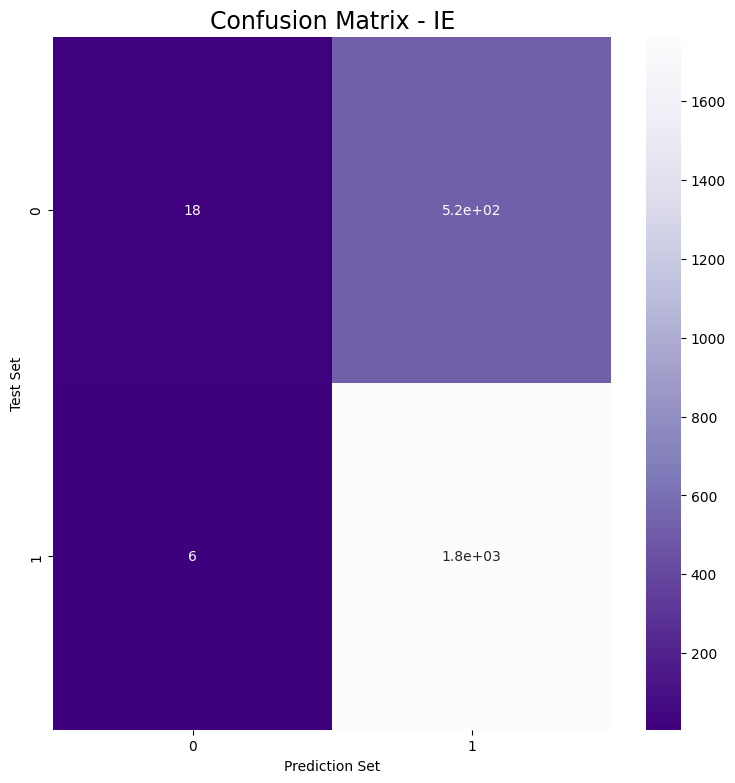

In [124]:
plt.figure()
plt.figure(figsize=(9,9))
confusion_Matrix = metrics.confusion_matrix(y_test_ie, y_lr_ie)
sns.heatmap(confusion_Matrix, annot=True, cmap='Purples_r')
plt.ylabel('Test Set')
plt.xlabel('Prediction Set')
plt.title('Confusion Matrix - IE', size=17)
plt.show()

In [144]:
lr_grid_search_ns = GridSearchCV(lr_model, {}, cv=5)

y_lr_ns = lr_grid_search_ns.fit(x_train_ns, y_train_ns).best_estimator_.predict(x_test_ns)
print(f'\nPrediction: {y_lr_ns}')

print(classification_report(y_test_ns, y_pred=y_lr_ns))

acc_lr_ns = accuracy_score(y_test_ns, y_pred=y_lr_ns)
print(f'\nAccuracy Score: {acc_lr_ns}')


Prediction: ['N' 'N' 'N' ... 'N' 'N' 'N']
              precision    recall  f1-score   support

           N       0.86      1.00      0.93      1983
           S       0.00      0.00      0.00       321

    accuracy                           0.86      2304
   macro avg       0.43      0.50      0.46      2304
weighted avg       0.74      0.86      0.80      2304


Accuracy Score: 0.8606770833333334


C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471

<Figure size 640x480 with 0 Axes>

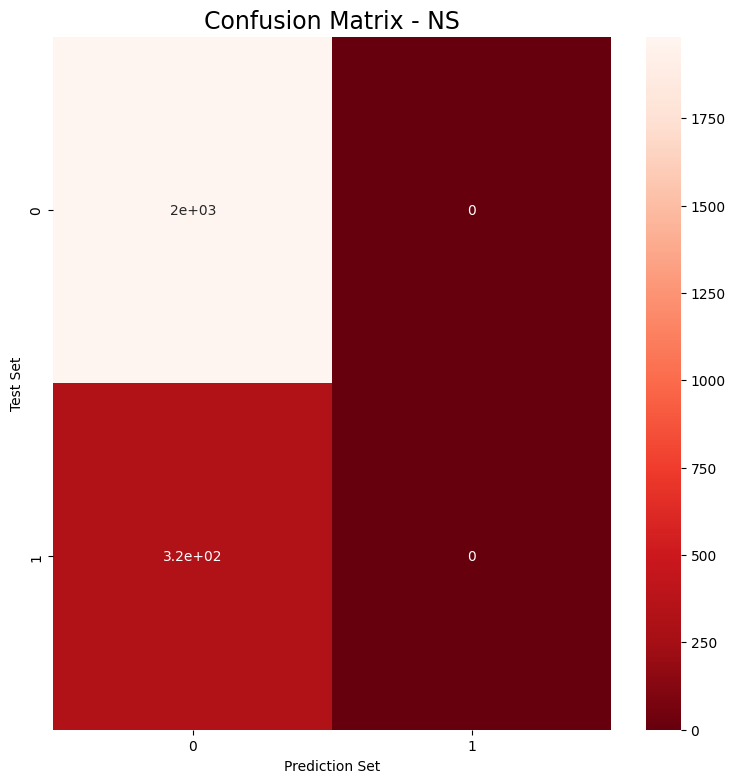

In [126]:
plt.figure()
plt.figure(figsize=(9,9))
confusion_Matrix = metrics.confusion_matrix(y_test_ns, y_lr_ns)
sns.heatmap(confusion_Matrix, annot=True, cmap='Reds_r')
plt.ylabel('Test Set')
plt.xlabel('Prediction Set')
plt.title('Confusion Matrix - NS', size=17)
plt.show()

In [145]:
lr_grid_search_ft = GridSearchCV(lr_model, {}, cv=5)

y_lr_ft = lr_grid_search_ft.fit(x_train_ft, y_train_ft).best_estimator_.predict(x_test_ft)
print(f'\nPrediction: {y_lr_ft}')

print(classification_report(y_test_ft, y_pred=y_lr_ft))

acc_lr_ft = accuracy_score(y_test_ft, y_pred=y_lr_ft)
print(f'\nAccuracy Score: {acc_lr_ft}')


Prediction: ['F' 'T' 'F' ... 'T' 'F' 'F']
              precision    recall  f1-score   support

           F       0.82      0.83      0.82      1278
           T       0.78      0.77      0.77      1026

    accuracy                           0.80      2304
   macro avg       0.80      0.80      0.80      2304
weighted avg       0.80      0.80      0.80      2304


Accuracy Score: 0.8003472222222222


<Figure size 640x480 with 0 Axes>

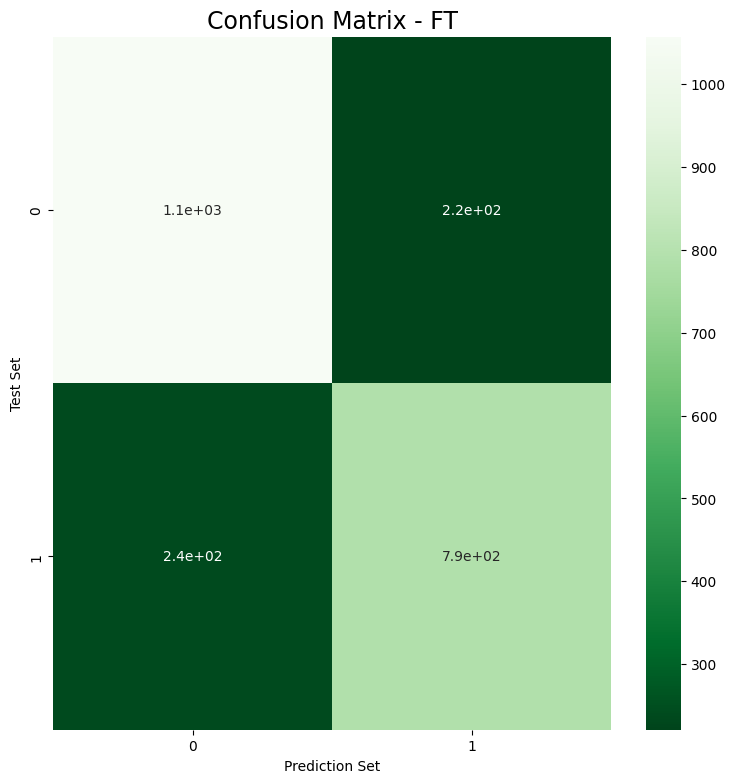

In [128]:
plt.figure()
plt.figure(figsize=(9,9))
confusion_Matrix = metrics.confusion_matrix(y_test_ft, y_lr_ft)
sns.heatmap(confusion_Matrix, annot=True, cmap='Greens_r')
plt.ylabel('Test Set')
plt.xlabel('Prediction Set')
plt.title('Confusion Matrix - FT', size=17)
plt.show()

In [146]:
lr_grid_search_pj = GridSearchCV(lr_model, {}, cv=5)

y_lr_pj = lr_grid_search_pj.fit(x_train_pj, y_train_pj).best_estimator_.predict(x_test_pj)
print(f'\nPrediction: {y_lr_pj}')

print(classification_report(y_test_pj, y_pred=y_lr_pj))

acc_lr_pj = accuracy_score(y_test_pj, y_pred=y_lr_pj)
print(f'\nAccuracy Score: {acc_lr_pj}')


Prediction: ['P' 'P' 'P' ... 'P' 'P' 'P']
              precision    recall  f1-score   support

           J       0.72      0.33      0.45       920
           P       0.67      0.92      0.77      1384

    accuracy                           0.68      2304
   macro avg       0.70      0.62      0.61      2304
weighted avg       0.69      0.68      0.65      2304


Accuracy Score: 0.6805555555555556


<Figure size 640x480 with 0 Axes>

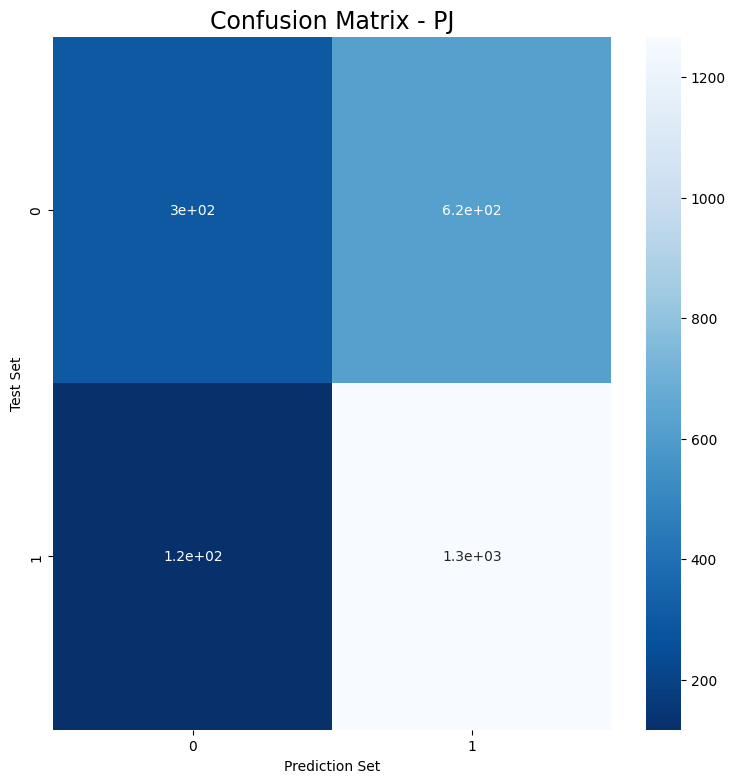

In [130]:
plt.figure()
plt.figure(figsize=(9,9))
confusion_Matrix = metrics.confusion_matrix(y_test_pj, y_lr_pj)
sns.heatmap(confusion_Matrix, annot=True, cmap='Blues_r')
plt.ylabel('Test Set')
plt.xlabel('Prediction Set')
plt.title('Confusion Matrix - PJ', size=17)
plt.show()

In [18]:
rtc_ie = RandomForestClassifier(max_depth=9, min_samples_split=10, random_state=123)
rtc_ie_cv = GridSearchCV(rtc_ie, {}, cv=5)

y_rtc_ie = rtc_ie_cv.fit(x_train_ie, y_train_ie).best_estimator_.predict(x_test_ie)
print(f'\nPrediction: {y_rtc_ie}')

print(classification_report(y_test_ie, y_pred=y_rtc_ie))

acc_rtc_ie = accuracy_score(y_test_ie, y_pred=y_rtc_ie)
print(f'\nAccuracy Score: {acc_rtc_ie}')


Prediction: ['I' 'I' 'I' ... 'I' 'I' 'I']
              precision    recall  f1-score   support

           E       0.00      0.00      0.00       535
           I       0.77      1.00      0.87      1769

    accuracy                           0.77      2304
   macro avg       0.38      0.50      0.43      2304
weighted avg       0.59      0.77      0.67      2304


Accuracy Score: 0.7677951388888888


C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1471

: 

### Prediction...?

In [147]:
def preprocessor(sentence):
    # to lower case
    sentence = sentence.lower()

    # remove URLs
    sentence = re.sub(r'http\S+', '', sentence)

    # remove special characters and numbers
    sentence = re.sub(r'[^a-zA-Z\s]', ' ', str(sentence))

    # remove extra spaces
    sentence = ' '.join(sentence.split())

    # remove the mbti types from the dataset
    for mbti in mbti_types:
        sentence = sentence.replace(mbti, '')

    # remove the stop words
    stopWords = set(stopwords.words('english'))
    words = nltk.word_tokenize(sentence)
    words = [word for word in words if word not in stopWords]
    
    # lemmatize the words in the dataset
    words = [lemmatizer.lemmatize(word) for word in words]

    processed_sentence = ' '.join(words)

    return processed_sentence

In [174]:
trial_sentence = '''
To all of those who have asked, I will not be going to the Inauguration on January 20th.
The 75,000,000 great American Patriots who voted for me, AMERICA FIRST, and MAKE AMERICA GREAT AGAIN, will have a GIANT VOICE long into the future. They will not be disrespected or treated unfairly in any way, shape or form!!!
I am asking for everyone at the U.S. Capitol to remain peaceful. No violence! Remember, WE are the Party of Law & Order – respect the Law and our great men and women in Blue. Thank you!
Please support our Capitol Police and Law Enforcement. They are truly on the side of our Country. Stay peaceful!
These scoundrels are only toying with the 
@sendavidperdue
 (a great guy) vote. Just didn’t want to announce quite yet. They’ve got as many ballots as are necessary. Rigged Election!
Even Mexico uses Voter I.D.
'''

In [175]:
processed_sentence = preprocessor(trial_sentence)

print('Original Sentence: ', trial_sentence)
print('\nPre-Processed Sentence: ', processed_sentence)

Original Sentence:  
To all of those who have asked, I will not be going to the Inauguration on January 20th.
The 75,000,000 great American Patriots who voted for me, AMERICA FIRST, and MAKE AMERICA GREAT AGAIN, will have a GIANT VOICE long into the future. They will not be disrespected or treated unfairly in any way, shape or form!!!
I am asking for everyone at the U.S. Capitol to remain peaceful. No violence! Remember, WE are the Party of Law & Order – respect the Law and our great men and women in Blue. Thank you!
Please support our Capitol Police and Law Enforcement. They are truly on the side of our Country. Stay peaceful!
These scoundrels are only toying with the 
@sendavidperdue
 (a great guy) vote. Just didn’t want to announce quite yet. They’ve got as many ballots as are necessary. Rigged Election!
Even Mexico uses Voter I.D.


Pre-Processed Sentence:  asked going inauguration january th great american patriot voted america first make america great giant voice long future disr

In [176]:
vector_sentence = pipeline.named_steps['vectorizer'].transform([processed_sentence])
print('Vectorized Sentence: ', vector_sentence)

Vectorized Sentence:    (0, 2479)	2
  (0, 2482)	1
  (0, 3023)	1
  (0, 4382)	1
  (0, 4391)	1
  (0, 5881)	1
  (0, 8094)	1
  (0, 10558)	2
  (0, 15373)	1
  (0, 19680)	1
  (0, 22126)	1
  (0, 22899)	1
  (0, 24084)	1
  (0, 24155)	1
  (0, 26478)	1
  (0, 27331)	1
  (0, 28388)	1
  (0, 29392)	1
  (0, 29972)	1
  (0, 30218)	1
  (0, 30534)	4
  (0, 31159)	1
  (0, 38214)	1
  (0, 41472)	3
  (0, 43026)	1
  :	:
  (0, 61058)	1
  (0, 61090)	1
  (0, 61550)	1
  (0, 62164)	1
  (0, 64443)	1
  (0, 65623)	1
  (0, 66426)	1
  (0, 69783)	1
  (0, 71434)	1
  (0, 73363)	1
  (0, 73399)	1
  (0, 75105)	1
  (0, 75444)	1
  (0, 75828)	1
  (0, 77327)	1
  (0, 78353)	1
  (0, 79440)	1
  (0, 79670)	1
  (0, 79760)	1
  (0, 79761)	1
  (0, 79763)	1
  (0, 80143)	1
  (0, 80390)	1
  (0, 81825)	1
  (0, 83078)	1


In [177]:
prediction_ie = nb_grid_search_ie.best_estimator_.predict(vector_sentence)
print(prediction_ie)

prediction_ns = nb_grid_search_ns.best_estimator_.predict(vector_sentence)
print('\n', prediction_ns)

prediction_ft = nb_grid_search_ft.best_estimator_.predict(vector_sentence)
print('\n', prediction_ft)

prediction_pj = nb_grid_search_pj.best_estimator_.predict(vector_sentence)
print('\n', prediction_pj)

['I']

 ['N']

 ['F']

 ['P']


C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but MultinomialNB was fitted with feature names
  warnings.warn(


In [178]:
prediction_lr_ie = lr_grid_search_ie.best_estimator_.predict(vector_sentence)
print(prediction_ie)

prediction_lr_ns = lr_grid_search_ns.best_estimator_.predict(vector_sentence)
print('\n', prediction_ns)

prediction_lr_ft = lr_grid_search_ft.best_estimator_.predict(vector_sentence)
print('\n', prediction_ft)

prediction_lr_pj = lr_grid_search_pj.best_estimator_.predict(vector_sentence)
print('\n', prediction_pj)

['I']

 ['N']

 ['F']

 ['P']


C:\Users\seren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
